Last modified: September 5, 2019

Description: This notebook takes the data scrapped from boardgamegeek.com, cleans the data, and uses scikit-surprise to predict ratings using singular value decomposition (SVD). This allows the model to recommend games to the users based on how they and other users reviewed games.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

from surprise import Reader, Dataset, accuracy, SVD
from surprise.model_selection import train_test_split

First, we load the scrapped ratings. The dataframe is structured as username | gameid | rating.

In [2]:
df_ratings=pd.read_csv('bgg_ratings.csv')
df_ratings.head()

/home/kloew/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,username,gameid,rating
0,sidehacker,13,10
1,Varthlokkur,13,10
2,dougthonus,13,10
3,cypar7,13,10
4,ssmooth,13,10


Before the data can be analyzed, it has to be cleaned and organized.

There is a different number of usernames than gameids and ratings. This indicates that NA's exist. 

Also, some of the ratings and gameid values are strings instead of numerical values.

In [3]:
df_ratings.count()

username    14714375
gameid      14714431
rating      14714431
dtype: int64

In [4]:
df_ratings.nunique(axis=0, dropna=True)

username    296937
gameid       12688
rating       10427
dtype: int64

The data is cleaned by dropping duplicate values and filtering out users who rated less than 10 games. 

The ratings and gameid values are then converted to numerical values, and if that isn't possible removed.

In [5]:
df_ratings.drop_duplicates(keep='first', inplace=True) 
df_ratings=df_ratings.groupby('username').filter(lambda x: len(x)>10)
df_ratings['rating']=pd.to_numeric(df_ratings['rating'],errors='coerce')
df_ratings=df_ratings.dropna()
df_ratings['gameid']=pd.to_numeric(df_ratings['gameid'],downcast='integer')
df_ratings.count()

username    14163975
gameid      14163975
rating      14163975
dtype: int64

Our useable dataset has 14163975 rows to consider.

This has 166876 unique usernames and 12600 games.

In [6]:
df_ratings.nunique(axis=0, dropna=True)

username    166876
gameid       12600
rating        8499
dtype: int64

In [7]:
df_ratings.head()

,username,gameid,rating
1,Varthlokkur,13,10.0
3,cypar7,13,10.0
4,ssmooth,13,10.0
5,Halloran,13,10.0
6,isamu,13,10.0


I then made a histogram of the ratings. We see that the data is left skewed and has secondary peaks. The median value is 7, but there are noticeable peaks at 5 and 9. This is likely due to users interpretting the 10 point scale differently. 

A box-cox transformation could be implemented to handle the skew, but this notebook wants to do a very simple out of the box analysis. In Data_Exploration.ipynb I consider improvements to the data.

/home/kloew/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


mean: 7.199541695213835
median: 7.0


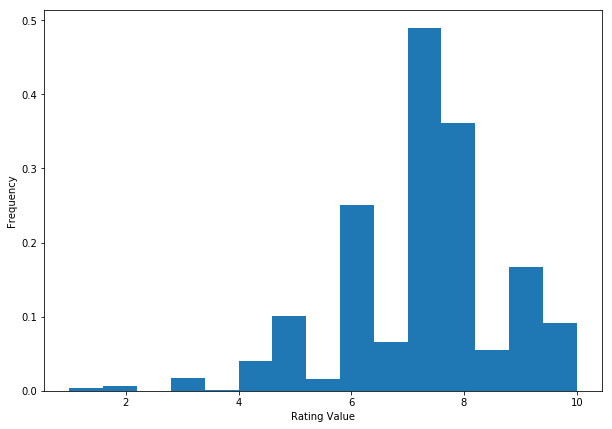

In [8]:
plt.figure(figsize=(10,7))
plt.hist(df_ratings['rating'],15,normed=True);
plt.xlabel('Rating Value')
plt.ylabel('Frequency')

print('mean:',np.mean(df_ratings['rating']))
print('median:',np.median(df_ratings['rating']))

A reader is defined to intepret the dataframe. The dataframe is then converted into a Dataset object which is used by scikit-surprise to do Matrix Factorization.

This follows the method outlined in the scikit-surprise documentation and this medium article.
https://medium.com/hacktive-devs/recommender-system-made-easy-with-scikit-surprise-569cbb689824

In [9]:
reader=Reader(rating_scale=(1,10))
data=Dataset.load_from_df(df_ratings[['username','gameid','rating']], reader)

The data is split into training and test sets using an 85/15 split.

In [10]:
trainset, testset=train_test_split(data, test_size=0.15)

I used an SVD model because it typically performs well on this type of problem. 

The model is then fit with training data.

In [11]:
model=SVD()
model.fit(trainset)

The trained model is asked to predict against the test data. and the root mean square error (rmse) calculated.

In [12]:
predictions=model.test(testset)

In [13]:
accuracy.rmse(predictions);

RMSE: 1.0469


For curiousity, I looked at the first 5 predictions.

In [14]:
predictions[:5]

[Prediction(uid='Dee3003', iid=137909, r_ui=6.0, est=5.541362500376722, details={'was_impossible': False}),
 Prediction(uid='Ecowarmachine', iid=526, r_ui=7.0, est=7.441015953667444, details={'was_impossible': False}),
 Prediction(uid='radoslawusb', iid=123370, r_ui=8.0, est=6.863901777250799, details={'was_impossible': False}),
 Prediction(uid='whst', iid=91312, r_ui=9.0, est=8.281807453492693, details={'was_impossible': False}),
 Prediction(uid='prdwong', iid=6263, r_ui=6.0, est=6.390326318595917, details={'was_impossible': False})]

Since most people know the games' names instead of the BGG id number, I use the scrapped gamelist to give the recommend game name instead of the id.

In [15]:
df_games=pd.read_csv('bgg_gamelist.csv')
df_games['gameid']=pd.to_numeric(df_games['id'],downcast='integer')
df_games.head()

,id,name,nrate,gameid
0,13,Catan,87271,13
1,822,Carcassonne,86952,822
2,30549,Pandemic,85739,30549
3,68448,7 Wonders,70996,68448
4,36218,Dominion,69531,36218


I make a dictionary which uses the gameid to retrieve the name.

In [16]:
gameDict={}
for ID in df_games['id'].values:
    gameDict[ID]=df_games[df_games['id']==ID]['name'].values[0]
gameDict

{13: 'Catan',
 822: 'Carcassonne',
 30549: 'Pandemic',
 68448: '7 Wonders',
 36218: 'Dominion',
 9209: 'Ticket to Ride',
 31260: 'Agricola',
 3076: 'Puerto Rico',
 40692: 'Small World',
 178900: 'Codenames',
 2651: 'Power Grid',
 70323: 'King of Tokyo',
 14996: 'Ticket to Ride: Europe',
 129622: 'Love Letter',
 148228: 'Splendor',
 478: 'Citadels',
 173346: '7 Wonders Duel',
 39856: 'Dixit',
 167791: 'Terraforming Mars',
 169786: 'Scythe',
 28143: 'Race for the Galaxy',
 110327: 'Lords of Waterdeep',
 34635: 'Stone Age',
 84876: 'The Castles of Burgundy',
 1927: 'Munchkin',
 65244: 'Forbidden Island',
 12333: 'Twilight Struggle',
 163412: 'Patchwork',
 15987: 'Arkham Horror',
 11: 'Bohnanza',
 150376: 'Dead of Winter: A Crossroads Game',
 120677: 'Terra Mystica',
 98778: 'Hanabi',
 50: 'Lost Cities',
 161936: 'Pandemic Legacy: Season 1',
 41114: 'The Resistance',
 230802: 'Azul',
 10547: 'Betrayal at House on the Hill',
 37111: 'Battlestar Galactica: The Board Game',
 131357: 'Coup',
 

Rather than give every game. I opted to return only the top n values (as specified by the user). 

Luckily, I did not have to write anything because the scikit-surprise documentation already had this.

https://surprise.readthedocs.io/en/stable/FAQ.html

In [17]:
def get_top_n(predictions, n=10):
    '''Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    '''

    # First map the predictions to each user.
    top_n=defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((gameDict[iid], est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid]=user_ratings[:n]

    return top_n

In [18]:
top_n=get_top_n(predictions, n=5)

for uid, user_ratings in top_n.items():
    print(uid, [iid for (iid, _) in user_ratings])

Dee3003 ['Carcassonne', 'Patchwork', 'Skip-Bo', 'Bugs in the Kitchen']
Ecowarmachine ['Arkham Horror', 'Jäger und Sammler', 'Carcassonne: Expansion 5 – Abbey & Mayor', 'Abalone Classic', 'Mag·Blast (Third Edition)']
radoslawusb ['Scythe', 'A Game of Thrones: The Board Game (Second Edition)', 'Abyss: Kraken', 'A Game of Thrones: The Board Game (Second Edition) – A Dance with Dragons', 'A Game of Thrones: The Card Game (Second Edition)']
whst ['Puerto Rico', 'The Pillars of the Earth', 'A Game of Thrones: The Board Game (Second Edition)', 'Discworld: Ankh-Morpork', 'Alcatraz: The Scapegoat']
prdwong ['Power Grid: Northern Europe/United Kingdom & Ireland', 'Power Grid: The New Power Plant Cards', "Memoir '44: Eastern Front", "Memoir '44: Terrain Pack", 'Lords of Waterdeep: Scoundrels of Skullport']
bazyn ['Puerto Rico', "Tzolk'in: The Mayan Calendar – Tribes & Prophecies", 'Star Wars: Rebellion', 'Android: Netrunner – Order and Chaos', 'The Resistance: Avalon']
Wadim ['Chaos in the Old Wo

xistonxiston ['Scythe', 'A Feast for Odin', 'Rising Sun', 'Scythe: Promo Pack #2 – Encounter Cards 33-36', 'Concordia: Salsa']
osgagu ['Mansions of Madness: Second Edition – Beyond the Threshold: Expansion', 'Stone Age: Anniversary', 'The Castles of Burgundy', 'Catan: 5-6 Player Extension', 'Rhino Hero: Super Battle']
alx145 ['Small World', 'Hero Realms: Character Pack – Wizard', 'Star Realms', 'Small World Underground', 'Endeavor: Age of Sail']
engstrom ['Discworld: Ankh-Morpork', 'King of Tokyo: Halloween', 'Exploding Kittens: NSFW Deck', 'Carcassonne: The River', 'Zombies!!! 2: Zombie Corps(e)']
Vader78 ['PitchCar Extension', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'Great Western Trail', 'Dominion: Prosperity', 'Ricochet Robots']
thawey ['Dinosaur Island', 'Dice Throne: Season One', 'Agricola (Revised Edition)', 'Dominion', 'Codenames: Pictures']
bane221 ['The Lord of the Rings: Journeys in Middle-earth', 'Mansions of Madness: Second Edition', 'Arch

Optramark ['Battlestar Galactica: The Board Game – Pegasus Expansion', 'A Touch of Evil: Something Wicked Expansion', 'Five Tribes', 'A Touch of Evil: The Supernatural Game', 'Dead of Winter: A Crossroads Game']
Kairos2010 ['Twilight Struggle', 'Dune', 'Chaos in the Old World', 'King of Tokyo', 'Puerto Rico (with two expansions)']
brhanse ['Android: Netrunner', 'Cosmic Encounter: Cosmic Alliance', 'One Night Ultimate Werewolf', 'Pandemic', 'The Resistance']
Phreekshow1 ['Catan', 'Smash Up: Pretty Pretty Smash Up', 'Citadels', 'Say Anything', 'Splendor']
Edrak ['Race for the Galaxy', 'Deus', 'BattleLore', 'Catan', 'Ticket to Ride: Märklin']
giovdigi ['Puerto Rico', 'The Great Zimbabwe', 'Terra Mystica', 'Cthulhu Wars', 'Dominant Species']
syphon ['Sentinels of the Multiverse: Silver Gulch, 1883 Environment', 'Sentinels of the Multiverse: Miss Information Villain Character', 'Sentinels of the Multiverse: Villains of the Multiverse', 'Sentinels of the Multiverse: Redeemer Fanatic Promo Ca

Kocmoc ['A Feast for Odin', "Sid Meier's Civilization: The Board Game", 'Caylus', 'Gùgōng', 'Rajas of the Ganges']
Sakabra ['Scythe: Invaders from Afar', 'Rising Sun: Daimyo Box', 'The Castles of Burgundy', 'Ascension: Realms Unraveled', 'Roll Player']
Blockasaurus ['Eclipse', 'Quadropolis', 'Mistfall', 'T.I.M.E Stories', 'Evolution']
csibadajoz ['Through the Ages: A Story of Civilization', '1830: Railways & Robber Barons', 'Power Grid: Factory Manager', 'Conflict of Heroes: Awakening the Bear! – Operation Barbarossa 1941 (second edition)', 'Mediterranean Empires']
Spazgoria ['Pandemic', 'Catan Card Game', 'Carcassonne', 'Wizard', 'Barbarossa']
Wisphunter ['Mansions of Madness: Second Edition', 'Eldritch Horror', 'Ticket to Ride', 'Star Wars: Armada – Home One Expansion Pack', 'Star Wars: X-Wing Miniatures Game']
capadotia ['Commands & Colors: Ancients', 'BattleLore', 'Paths of Glory', 'Tigris & Euphrates', 'Hammer of the Scots']
Mlisak203 ['Viticulture: Visit from the Rhine Valley', '

jeffreydavid2003 ['Robinson Crusoe: Adventures on the Cursed Island', '7 Wonders', 'Fireball Island: The Curse of Vul-Kar', 'Dominion', 'Codenames: Pictures']
SubtlyArtistic ['Codenames', 'Patchwork', 'Ghost Stories: White Moon', 'Star Realms', 'Agricola: All Creatures Big and Small – More Buildings Big and Small']
Wachtel ['Carcassonne: Expansion 2 – Traders & Builders', 'Kingsburg (Second Edition)', 'Small World: Royal Bonus', 'Carcassonne: Die Katharer', "That's Pretty Clever"]
nasthyr ['Terraforming Mars', 'Five Tribes', 'Terra Mystica', "Aeon's End", 'Pulsar 2849']
addman360 ['Five Tribes', 'Sheriff of Nottingham', 'Sushi Go!', 'One Night Ultimate Werewolf Daybreak', 'Guillotine']
jonatronleaf ['Street Masters', 'Eldritch Horror', 'Suburbia', 'Magic Maze', 'The Grizzled']
aspirino ['Poker', 'Battlestar Galactica: The Board Game', 'Chronicles of Crime', 'Orléans', 'Wingspan']
verlisia ['Concordia', 'Five Tribes', 'Agricola', 'Burgle Bros.', 'Mysterium']
trif ['Ra', 'Caylus', "I'm t

Erik_ritzen ['Conan', 'Skat', 'Space Hulk (third edition)', 'Descent: Journeys in the Dark (Second Edition)', 'WWE Superstar Showdown']
Phoenixgeek ['El Grande', 'Railways of Nippon', 'Brass: Lancashire', 'Keyflower', 'Power Grid: Québec/Baden-Württemberg']
catchmax ['Codenames', 'Terra Mystica', 'The Castles of Burgundy', 'Space Alert', 'Blood Rage']
djfeld01 ['Pandemic Legacy: Season 1', 'The Castles of Burgundy', 'Russian Railroads', 'My Little Scythe', 'Pandemic: In the Lab']
EternalB ['Secret Hitler', 'BattleCON: Devastation of Indines', 'Star Wars: Imperial Assault – Return to Hoth', 'War of the Ring (First Edition)', 'Merchants & Marauders']
sagamoderator ['Eurorails', 'India Rails', 'Dominion: Intrigue', 'China Rails', 'Blue Moon City']
BabycakesBurger ['Catan: Cities & Knights', 'Citadels', 'Small World', 'Dixit']
Faustoxx ['Food Chain Magnate', 'Automobile', 'Mombasa', '7 Wonders Duel', 'The Voyages of Marco Polo']
mathewsdad ['Sentinels of the Multiverse', 'Clans of Caledoni

Jonthebaker ['Pandemic Legacy: Season 1', 'Robinson Crusoe: Adventures on the Cursed Island', "Pathfinder Adventure Card Game: Mummy's Mask – Base Set", 'Blood Rage', 'Kemet']
zvitorepec ['Carcassonne: Expansion 2 – Traders & Builders', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'The Princes of Florence', 'Magic: The Gathering', 'Carcassonne: Expansion 3 – The Princess & The Dragon']
Conteck ['Dominion: Intrigue', 'Eurorails', 'Empire Builder', 'Catan: Cities & Knights', 'Gunslinger']
redpill ['Power Grid: The New Power Plant Cards', 'Pandemic: Rising Tide', 'Hanabi', 'Dominion: Hinterlands', 'Ticket to Ride: Märklin']
HerraS ['Twilight Struggle', 'Unconditional Surrender! World War 2 in Europe', 'Twilight Imperium (Third Edition): Shards of the Throne', 'Twilight Imperium (Third Edition)', 'Chaos in the Old World']
MatMiller ['Rising Sun', 'War of the Ring: Lords of Middle-earth', 'Blood Rage', 'Star Wars: Imperial Assault', 'Champions of Midgard: Valhalla']
unclefuzz ['Star Wars

Imot90 ['Commands & Colors: Ancients', 'Patchwork', 'Jaipur', 'King of Tokyo', 'Photosynthesis']
Kateywumpus ['Pandemic Legacy: Season 1', 'Arkham Horror: The Card Game', 'Android: Netrunner', 'Tiny Epic Galaxies: Beyond the Black', 'T.I.M.E Stories']
Tormenta ['Rising Sun: ASL Module 13', 'Next War: Korea', 'Festung Budapest', 'Yanks: ASL Module 3a', 'Red Barricades: ASL Historical Module 1']
Quilicus ['Android: Netrunner', 'Dominion: Prosperity', 'Dominion: Seaside', 'Terraforming Mars', 'Race for the Galaxy']
purespeculation ['Star Wars: Destiny', 'Warhammer 40,000: Kill Team', "Sid Meier's Civilization: A New Dawn", 'Doom: The Boardgame', 'Warmachine']
JudgeJacket ['Eldritch Horror: Forsaken Lore', 'Cataclysm: A Second World War', 'Combat Commander: Europe', 'Battlestar Galactica: The Board Game', 'Roll for the Galaxy']
fray88 ['Imperial Settlers', 'Red7', 'Exit: The Game – The Abandoned Cabin', 'Nemeton', 'Dice City: By Royal Decree']
bantoo ['T.I.M.E Stories', 'War of the Ring (F

nemspy ['Cerebria: The Inside World – Origin Box', 'Dixit: Harmonies', 'Everdell', 'Coimbra', 'Gentes']
soulceress ['Alien Frontiers', 'Letters from Whitechapel', 'Dungeon Petz', 'Citadels', 'Fresco']
drum_man2007 ['Gaia Project', 'Terra Mystica', 'Brass: Birmingham', 'Food Chain Magnate', 'Keyflower']
HeroesAverageAdam ['Arcadia Quest: Frost Dragon', 'Dominion: Dark Ages', 'Dominion: Alchemy', 'Sheriff of Nottingham: Merry Men', 'Kingdomino']
Sky Knight X ['Gloomhaven', 'Twilight Imperium (Third Edition): Shattered Empire', 'Rising Sun', 'Betrayal Legacy', 'Blood Rage: 5th Player Expansion']
josebald ['Age of Steam', 'The Gallerist', 'Orléans', 'Roll for the Galaxy', 'The Resistance']
UnalignedMagi ['Concordia', 'Great Western Trail', 'Eclipse: Shadow of the Rift', 'Love Letter Premium', 'Carcassonne: Expansion 2 – Traders & Builders']
M_Clou ['Eclipse', 'Quantum', 'Legendary: A Marvel Deck Building Game – Dark City', 'Star Realms', 'Star Wars: Imperial Assault – Bantha Rider Villain 

kemot_kajap ['Crokinole', 'Secret Hitler', 'Pendragon: The Fall of Roman Britain', 'KLASK', 'Troyes']
DrHooba ['Scythe', 'Pandemic Legacy: Season 1', 'Five Tribes', 'Kingdomino', 'Pandemic: On the Brink']
danrodz ['Space Hulk (fourth edition)', 'Xia: Legends of a Drift System', 'Legendary: A Marvel Deck Building Game', 'Tiny Epic Galaxies', 'Mega Man Pixel Tactics: Mega Man Blue']
grognard ['Puerto Rico', 'Empires in Arms', 'A Victory Lost: Crisis in Ukraine 1942-1943', "Memoir '44", 'Up Front']
jagaman ['Agricola', 'Mage Knight Board Game', 'Terra Mystica', 'Shogun', 'Trajan']
mattwran ['Pandemic Legacy: Season 1', 'Virgin Queen', 'Clash of Cultures: Civilizations', 'Crokinole', 'T.I.M.E Stories: A Prophecy of Dragons']
Monkey007 ['Star Trek: Fleet Captains – Romulan Empire', 'Twilight Struggle', 'Combat Commander: Battle Pack #2 – Stalingrad', 'Star Wars: X-Wing Miniatures Game – Rebel Transport Expansion Pack', 'Eldritch Horror: Mountains of Madness']
Mamut ['Agricola', 'Dixit', 'Co

Azure dragon ['Twilight Imperium (Third Edition): Shards of the Throne', 'Twilight Imperium (Fourth Edition)', 'Gloomhaven', 'Terra Mystica', 'Robinson Crusoe: Adventures on the Cursed Island']
frbr ['The Castle of the Devil', 'Shadow Hunters', '7 Wonders']
DavidWooderson ['Lords of Waterdeep', 'Rising Sun', 'Viticulture', 'Lost Cities', 'Ticket to Ride: Nordic Countries']
SwedeLad ['Puerto Rico', 'Santiago', 'Stone Age', 'Samurai', 'Saint Petersburg']
Salo sila ['Android: Netrunner', 'Triumph of Chaos', 'Twilight Struggle', 'Wingspan', 'Forbidden Stars']
Pusher ['Star Wars: Rebellion', 'Brass: Birmingham', 'Agricola', 'Poker', 'Power Grid Deluxe: Europe/North America']
sunibd ['Istanbul', 'Carcassonne', 'Tobago', 'Ticket to Ride: New York', 'Codenames: Pictures']
Board Gaming Bard ['Terra Mystica', 'Ticket to Ride: Europe', 'Torres', 'Ticket to Ride', 'Cosmic Encounter']
Seafront ['Teotihuacan: City of Gods', 'Yokohama', 'Hansa Teutonica', 'Endeavor: Age of Sail', 'Five Tribes']
chenk

Eric Brosius ['Race for the Galaxy', 'Baltic Gap', 'Here I Stand: 2-Player Diplomacy Deck', 'Puerto Rico (with two expansions)', "Ardennes '44"]
raspberryfh ['Everdell', '7 Wonders', 'Pandemic', 'Ghost Stories']
Sporatik ['Smash Up: Awesome Level 9000', 'Pandemic Legacy: Season 1', '7 Wonders', 'Stone Age: The Expansion', 'Dinosaur Island']
Cucamel ['War of the Ring (First Edition)', 'Eclipse', 'Archipelago', 'Marvel Dice Masters: Avengers vs. X-Men', 'Marvel Dice Masters: Uncanny X-Men']
risk9876 ['Pandemic Legacy: Season 1', 'Glory to Rome', 'Chaos in the Old World: The Horned Rat Expansion', 'Seasons', 'Terra Mystica: Fire & Ice']
keshavjee ['The Lord of the Rings: The Card Game', 'Through the Ages: A Story of Civilization', 'Puerto Rico', 'The Castles of Burgundy', 'Friday']
Steeveleo ['Gloomhaven', 'Ticket to Ride: Europe', 'Pandemic', 'Nexus Ops', 'Codenames']
manshoun ['Secret Hitler', '7 Wonders', 'Mombasa', 'Lords of Waterdeep: Scoundrels of Skullport', 'Kemet']
DanceVera ['Sp

MaChInAz ['7 Wonders Duel', 'Catan: Seafarers', 'El Grande Big Box', 'Carcassonne', 'Unlock! Escape Adventures']
Soleia ['Merchants & Marauders: Seas of Glory', 'Dominion', 'Beasts of Balance', 'Star Trek: Frontiers', 'Firefly: The Game – Jetwash']
IronMoss ['Terraforming Mars: Prelude', 'Puerto Rico', 'Sentinels of the Multiverse', 'Raiders of the North Sea: Hall of Heroes', 'Ticket to Ride: Europe']
squishnsquash ['Deception: Murder in Hong Kong', '7 Wonders Duel', 'BANG! The Dice Game', 'The Castles of Burgundy', 'Carcassonne']
Fribian ['Roads & Boats', 'Elder Sign: Unseen Forces', 'Tales of the Arabian Nights', 'Merchant of Venus (second edition)', 'Takenoko']
gorgue ['Bridge', 'Great Western Trail', 'Epic Spell Wars of the Battle Wizards: Duel at Mt. Skullzfyre', 'Roll for the Galaxy', 'Lewis & Clark']
bramadan ['Gloomhaven', 'Arkham Horror: The Card Game', 'Teotihuacan: City of Gods', 'Through the Ages: A New Story of Civilization', 'City of the Big Shoulders']
MidLifeDelta ['184

rshipp ['Clash for a Continent:  Battles of the American Revolution and French & Indian War', 'Taluva', 'The Scepter of Zavandor', 'Factory Fun', 'Macao']
Senor Swanky ['Chess', 'Through the Ages: A New Story of Civilization', 'Trajan', 'El Grande', 'Nations']
yomiyomi ['Terra Mystica', 'El Grande Big Box', 'Rising Sun: Dynasty Invasion', 'Keyflower: The Merchants', 'Vinhos Deluxe Edition']
zarsejm ['Age of Steam', 'Goa', 'Titan', 'Vikings', 'Modern Art']
bocaccio ['Star Wars: Rebellion', 'Blood Rage', 'Jamaica: The Crew', 'Eldritch Horror: Forsaken Lore', 'Zombicide: Green Horde']
yadisbeles ['Gloomhaven', 'Le Havre', 'Istanbul: Letters & Seals', 'A Feast for Odin', 'Through the Ages: A New Story of Civilization']
Mylan9 ['Cyclades', 'Lords of Hellas', 'Azul', '7 Wonders', 'Imperial Settlers']
lonetrixter ['Cosmic Encounter', 'Mexica', 'Smile', 'Arkham Horror', 'Java']
Robandstuff ['Star Wars: Rebellion', 'Terra Mystica', 'Star Wars: X-Wing Miniatures Game – Millennium Falcon Expansio

meurogeek ['Scythe: The Rise of Fenris', 'Terra Mystica: Fire & Ice', 'Orléans: Trade & Intrigue', 'Scythe: Invaders from Afar', 'Puerto Rico']
Kalanar ['Root', 'Endeavor: Age of Sail', '7 Wonders Duel: Pantheon', 'Star Realms', 'Race for the Galaxy: Alien Artifacts']
VerbalKint ['The Castles of Burgundy', 'The Voyages of Marco Polo', 'Blood Rage', "Tzolk'in: The Mayan Calendar", 'Stone Age']
Nightshape ['Eclipse', 'Great Western Trail', 'Scythe', 'Robinson Crusoe: Adventures on the Cursed Island', 'T.I.M.E Stories']
BaruchBorges ['Spirit Island', 'Inis', 'Castles of Mad King Ludwig', 'Sushi Go Party!', 'Concordia']
Berengere ['Scythe', 'Pandemic Legacy: Season 1', 'Viticulture Essential Edition', 'Rising Sun', 'Champions of Midgard']
Badgeroonie ['Twilight Struggle', 'Britannia', 'Doctor Who: Solitaire Story Game', 'Black Orchestra', 'DVONN']
haisku ['Pericles: The Peloponnesian Wars', 'Keyflower', 'War of the Ring (Second Edition)', 'Dominant Species', 'Concordia']
ludomax ['Dominion

JoePel ['Super Dungeon Explore', 'Boss Monster: The Dungeon Building Card Game']
playgirl64 ['The Great Zimbabwe', '1846: The Race for the Midwest', 'Indonesia', 'Dominant Species', "Tzolk'in: The Mayan Calendar"]
gamerfry ['Tuscany: Expand the World of Viticulture', 'Terra Mystica: Fire & Ice', 'Twilight Imperium (Third Edition)', 'Twilight Imperium (Third Edition): Shards of the Throne', 'T.I.M.E Stories']
jarponen ['Through the Ages: A Story of Civilization', 'Brass: Lancashire', 'Samurai', 'Imperial', 'Goa']
Browncoat ["Memoir '44", 'Railways of the World', 'Dungeon Twister: Fire and Water', 'Dominant Species', 'Age of Steam']
LudiGaume ['Terra Mystica', 'Codenames: Pictures', 'Flamme Rouge: Peloton', 'Wingspan', 'Caylus']
Klocek94 ['Kemet', 'Dixit', 'Caverna: The Cave Farmers', 'Merchants & Marauders', 'Summoner Wars: Phoenix Elves vs Tundra Orcs']
wintermute ['Brass: Lancashire', 'Modern Art', 'Cosmic Encounter', 'Anachrony', 'Twilight Imperium (Third Edition)']
araiff ['Carcasso

LashtonBryth ['Twilight Struggle', 'Dominant Species', 'Le Havre', 'Dungeon Lords', "Time's Up! Deluxe"]
diGriz ['Galaxy Trucker', 'Warhammer: The Game of Fantasy Battles (8th Edition)', 'Warhammer: The Mass Combat Fantasy Roleplaying Game (1st Edition)', 'Imperium', 'Zombies!!! 3.5:  Not Dead Yet']
prz22 ['Arkham Horror: The Card Game', 'The New Era', 'Carcassonne: Expansion 2 – Traders & Builders', 'Citadels', 'Terraforming Mars']
eniac_g ['Puerto Rico', '7 Wonders Duel', 'El Grande', 'Dinosaur Island', 'First Class: All Aboard the Orient Express!']
dextermoe ['Dominion', 'Terraforming Mars', 'Caylus', 'For Sale', 'El Grande']
isax13 ['Deception: Murder in Hong Kong', 'Decrypto', 'Love Letter', 'Telestrations', 'Pandemic Legacy: Season 1']
Carthage ['Gaia Project', 'Mansions of Madness: Second Edition', 'Troyes', 'La Granja', 'Millennium Blades']
templebigk ['Hanamikoji', 'Sherlock Holmes Consulting Detective: Jack the Ripper & West End Adventures', '7 Wonders Duel', 'Grand Austria H

crazeguy ['Legendary: A Marvel Deck Building Game', 'The Castles of Burgundy', 'Valeria: Card Kingdoms', 'Agricola: All Creatures Big and Small – Even More Buildings Big and Small', 'Paperback']
Yc10010103 ['Battlestar Galactica: The Board Game', 'T.I.M.E Stories', 'Spirit Island', 'Through the Ages: A New Story of Civilization', "Kanban: Driver's Edition"]
Minnnie1234 ['Lords of Waterdeep: Scoundrels of Skullport', 'T.I.M.E Stories', 'Arkham Horror: The Card Game', 'Five Tribes', 'Roll Player']
HenchmanUK ['Ticket to Ride: Europe', 'Evil Baby Orphanage', 'Walk the Plank: Deluxe Edition', 'The Witches: A Discworld Game']
psuggitt ['Power Grid: China/Korea', 'Caylus', 'Orléans', 'Five Tribes', 'Troyes']
wolvespot ['Advanced Civilization', 'Agricola', 'Le Havre', 'Ground Floor', 'Civilization']
TikTom ['The Castles of Burgundy', 'Coimbra', 'The Voyages of Marco Polo', 'Azul', 'Patchwork']
Feinas ['Splendor', 'Legendary: A Marvel Deck Building Game', 'Dominion', 'Hanabi']
wread ['Targi', 

Shaun L ['Tigris & Euphrates', 'Go', 'Ticket to Ride: Europe', 'Pandemic', 'Citadels']
hockeyjedi ['Talisman (Revised 4th Edition)', 'Star Trek: Fleet Captains – Romulan Empire', 'Battlestar Galactica: The Board Game', 'Dungeons & Dragons: Wrath of Ashardalon Board Game', 'Catan']
Thinbunny ['Through the Ages: A Story of Civilization', 'Mage Knight Board Game', 'Mechs vs. Minions', 'Twilight Struggle', '7 Wonders']
DanielKlein ['Alhambra', 'Carcassonne: Expansion 8 – Bridges, Castles and Bazaars', 'Carcassonne: Expansion 4 – The Tower', 'Mississippi Queen']
Spinnster ['Viticulture Essential Edition', 'Orléans', 'Lords of Waterdeep: Scoundrels of Skullport', 'Blood Rage', 'Alchemists']
oost44 ['Spirit Island', 'Nations: Dynasties', 'Arkham Horror: The Card Game – The Dunwich Legacy: Expansion', 'Terraforming Mars: Hellas & Elysium']
ajgarrido ['Dominant Species', 'Gaia Project', 'Teotihuacan: City of Gods', 'Endeavor: Age of Sail', 'Valeria: Card Kingdoms']
TTIOttio ['Spirit Island', 'F

jinatti ['Through the Ages: A New Story of Civilization', 'Mansions of Madness: Second Edition – Streets of Arkham: Expansion', 'Spirit Island', 'Brass: Lancashire', 'Clans of Caledonia']
langsz ['Dominion', 'Wings of Glory: WW2 Battle of Britain Starter Set', 'Agricola', 'Meuterer', '6 nimmt!']
zoe79 ['Carcassonne: Expansion 2 – Traders & Builders', 'Carcassonne: Expansion 3 – The Princess & The Dragon', 'Citadels', 'Age of Empires III: The Age of Discovery', 'The Ark of the Covenant']
rmiczek ['Puerto Rico', 'Chimera Station', 'Dominion: Sauna / Avanto Promo Card', 'Railways of the World', 'Above and Below']
zorro_jv ['Virgin Queen', 'Eclipse', 'Battlestar Galactica: The Board Game', 'Puerto Rico', 'Galaxy Trucker']
stonestokes ['Star Wars: Imperial Assault', 'Battlestar Galactica: The Board Game', 'Kingdom Builder', "Ca$h 'n Guns (Second Edition)"]
apkendrick ['Quantum', 'Robinson Crusoe: Adventures on the Cursed Island', 'Neanderthal', 'A Feast for Odin', 'Empires of the Void II']


clublock ['Pandemic Legacy: Season 1', 'Spirit Island', 'Blood Rage', 'Robinson Crusoe: Adventures on the Cursed Island – Voyage of the Beagle (Vol. 1)', 'Battlestar Galactica: The Board Game – Pegasus Expansion']
Defcon ['Android: Netrunner', 'Race for the Galaxy', 'Pandemic: Iberia', 'Puerto Rico', 'Catan']
jorgearanda ['Commands & Colors: Ancients', 'Race for the Galaxy', 'Race for the Galaxy: The Gathering Storm', 'Fury of Dracula (Second Edition)', 'Ra']
tacozan ['Star Wars: Imperial Assault', 'King of Tokyo', 'Hedbanz for Adults!']
xtremecold ['Eldritch Horror', 'Terraforming Mars: Colonies', 'King of Tokyo', 'Sushi Go Party!', 'Dead of Winter: A Crossroads Game']
licoricemetal ['Commands & Colors: Ancients', 'Space Empires: Close Encounters', 'Labyrinth: The War on Terror, 2001 – ?', 'Battlestar Galactica: The Board Game – Pegasus Expansion', 'Tide of Iron']
JohnnyCreations ['Dominion: Intrigue', 'Eminent Domain', 'Catacombs', 'Gauntlet of Fools']
Caversham ['Glory to Rome', 'Pr

m22chan ['Lords of Waterdeep', 'Talisman (Revised 4th Edition)', 'Pandemic', 'Flash Point: Fire Rescue', 'Kings of Air and Steam']
oforcada ['The Castles of Burgundy', 'Yokohama', 'Architects of the West Kingdom', 'Terra Mystica', 'Lisboa']
pepe79 ["Memoir '44", 'Hive', 'Small World', 'Wingspan', 'Welcome To...']
okstevep ['Brass: Birmingham', 'Codenames', 'Exploding Kittens', 'Cards Against Humanity', 'A Few Acres of Snow']
ThorgrimThunder ['Clank!: A Deck-Building Adventure', 'Chronicles of Crime', 'Spyrium', 'Dominion']
RoadHouse ['Spirit Island', 'Commands & Colors: Ancients', 'Through the Ages: A Story of Civilization', 'Duel of Ages II', 'Space Empires: Close Encounters']
MHarrison5 ['Puerto Rico', 'Shadows over Camelot', 'Forbidden Island', 'Lord of the Rings: The Confrontation', 'RoboRally']
Barbusak ['Pandemic', 'Pandemic: On the Brink', '7 Wonders: Leaders', 'Small World', 'Kingsburg: To Forge a Realm']
garxing ['Runewars', 'Cyclades', 'Five Tribes', 'Notre Dame', 'Patchwork'

pilot ['Battlestar Galactica: The Board Game', 'Twilight Imperium (Third Edition)', 'Triumph & Tragedy', 'Race for the Galaxy: The Brink of War', 'Arkham Horror (Third Edition)']
Eumel ['Shadows of Brimstone: Other Worlds – Trederra', 'Twilight Imperium (Third Edition)', 'The New Era', 'Sekigahara: The Unification of Japan', 'Eldritch Horror']
mae2136 ['Agricola (Revised Edition)', 'Star Wars: Rebellion', 'Pandemic: Iberia', 'Pandemic Legacy: Season 1', 'Elder Sign']
alainboom ['Caylus', 'Cyclades: Hades', 'Le Havre Expansion: Essen Promo Cards', 'La Granja', 'Tumblin-Dice']
TomAguero ['Terraforming Mars', 'Scythe', 'Pandemic', '7 Wonders', "Aeon's End"]
wolfpack95 ['Sekigahara: The Unification of Japan', 'Scythe', 'Warrior Knights: Crown and Glory', 'Commands & Colors: Napoleonics', 'BattleLore: Epic BattleLore']
BugbearSlayer ['Magic: The Gathering', 'The Resistance', 'Ticket to Ride: Germany', 'Robinson Crusoe: Adventures on the Cursed Island', 'Terraforming Mars']
MrQeu ['Power Gri

Christerical ['Catan', 'Love Letter', 'The Little Prince: Make Me a Planet', "Can't Stop", 'Cockroach Poker']
ThirdStringHero ['Pandemic Legacy: Season 1', 'Cosmic Encounter', 'Through the Ages: A New Story of Civilization', 'Mage Knight Board Game', 'The 7th Continent']
fantasard ['Chaos in the Old World', 'Endeavor', 'Arkham Horror', 'World of Warcraft: The Boardgame', "A Dog's Life"]
tacox01 ['Magic: The Gathering', 'Eldritch Horror', 'Battlestar Galactica: The Board Game', 'Orléans', 'Lords of Waterdeep']
canadiankorean ['Mechs vs. Minions', 'Raccoon Tycoon', 'Patchwork', 'Ethnos', 'Space Base']
crikeythecat ['Legendary Encounters: An Alien Deck Building Game', 'Brass: Birmingham', 'Dixit', 'Pandemic', 'Carcassonne']
KillerCrusoe11 ['7 Wonders Duel', 'Charterstone', 'Hive', 'Codenames: Duet', 'Camel Up']
Lu Tze ['Love Letter', 'San Juan', 'Forbidden Island']
Lorenz79 ['Catan', 'Munchkin 2: Unnatural Axe', 'Carcassonne', 'Siege', 'Reds! The Russian Civil War 1918-1921']
Orbesteanu [

BigWang ['Blood Rage', 'Kemet', 'Eminent Domain: Escalation', 'Glory to Rome', "Sid Meier's Civilization: The Board Game – Fame and Fortune"]
LittleNapolean ["War of the Ring Collector's Edition", 'Power Grid: China/Korea', 'Race for the Galaxy', 'The Castles of Burgundy', 'Twilight Imperium (Third Edition)']
anguschu ['Paths of Glory', 'Through the Ages: A New Story of Civilization', 'Agricola', 'Indonesia', 'Ticket to Ride']
wretchosoft ['Container', 'Pax Porfiriana', 'Kemet: Ta-Seti', 'Steam', 'Goa']
Hatricvs ['Hammer of the Scots', 'Up Front', 'Legion of Honor', 'EastFront', 'Empires in America: The French and Indian War, 1754-62']
dionni ['Tyrants of the Underdark', 'Firenze', 'Istanbul', 'Pandemic', 'Skull']
Flynn Lives ['Pandemic Legacy: Season 1', 'Star Wars: Rebellion', 'Robinson Crusoe: Adventures on the Cursed Island', 'Caverna: The Cave Farmers', 'Pandemic: On the Brink']
decker161314 ['Tuscany: Expand the World of Viticulture', 'Puerto Rico', 'Eclipse', 'Formula D', 'The B

bthermans ['Twilight Imperium (Third Edition): Shattered Empire', 'Carcassonne: Expansion 2 – Traders & Builders', 'Lancaster', 'Blue Moon: The Aqua', 'A Game of Thrones (First Edition)']
pumpfire7 ['Spy Alley']
Aphamino ['Chaos in the Old World', 'Dominion: Intrigue']
mwm1975mwm1975 ['Caverna: The Cave Farmers', 'Dominion (Second Edition) Big Box', 'Carcassonne: Expansion 2 – Traders & Builders', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'Arkham Horror: The Card Game – The Dunwich Legacy: Expansion']
sjhjudd ['Sushi Go!', 'Onitama', '51st State: Master Set', 'Mission: Red Planet (Second Edition)', 'Battlestar Galactica: The Board Game']
rapid31415 ['Combat Commander: Europe', 'Paths of Glory', 'Infinity', 'Conflict of Heroes: Eastern Front – Solo Expansion', 'Tunisia II']
SonuvaGlitch ['7 Wonders', 'Lotus', 'Lanterns: The Harvest Festival', 'Castle Panic']
ryoppei ['El Grande', 'Ticket to Ride: Europe', 'Rummikub', 'Virus!', 'Escape from Colditz']
jeffcha ['Tales of the Arabian 

Baldwin ['Dead of Winter: A Crossroads Game', 'Agricola', 'Pandemic', 'Mice and Mystics', 'The Castle of the Devil']
BG_Geek ['Tiny Epic Galaxies', "Firefly: The Game – Breakin' Atmo", 'Café International']
tanik ['The Republic of Rome', 'Magic: The Gathering', 'Football Strategy', 'Ambush!', 'MedFront']
lhfreak ['Cosmic Encounter', 'Duel of Ages II: Master Set', 'RoboRally: Armed and Dangerous', 'Commands & Colors: Ancients', 'Duel of Ages Set 1: Worldspanner']
skywoshidxf ['Magic: The Gathering', 'Imperial 2030', 'Pandemic', 'Macao', 'Twilight Imperium (Third Edition)']
khystra42 ['Carcassonne', 'Chez Goth']
Sergiozg ['Splendor', 'Star Realms', 'Photosynthesis', 'Carcassonne: Expansion 2 – Traders & Builders', 'Machi Koro: Harbor']
aviavi16 ['Patchwork', 'Charterstone', 'Medieval Academy', 'Flash Point: Fire Rescue', 'Star Realms: Crisis – Bases & Battleships']
NyteFox ['Battlestar Galactica: The Board Game – Exodus Expansion', 'Cosmic Encounter', 'Race for the Galaxy: Alien Artifact

BBHouseRodent ['Mansions of Madness: Second Edition', 'Bruges', 'Mission: Red Planet (Second Edition)', 'Crokinole', 'Passing Through Petra']
EyeLost ['Kings of War', 'Ticket to Ride: Europe', 'Dominion', 'Star Realms', 'Dust Warfare: Core Rulebook']
chaps31 ['Brass: Lancashire', 'Architects of the West Kingdom', 'Monster Lands', '7 Wonders Duel', 'Gùgōng']
Psychic_Flakk ['Cry Havoc', 'RAF', 'MERCS: Recon – Counter Threat', 'Starfighter', 'Epic PVP: Fantasy']
fgoulartadv ['Star Wars: Destiny', 'Star Wars: X-Wing Miniatures Game', 'Fields of Fire', '7 Wonders', 'The Castles of Burgundy']
GiveMeLight ['Star Realms', 'Hive', 'Tsuro', 'Blokus Duo', 'Yardmaster']
quardlepleen ['Railways of the World', '7 Wonders', 'Dixit', 'Lord of the Rings: The Confrontation', 'Brass: Lancashire']
Tobsi ['Brass: Lancashire', 'Eclipse', 'Dungeon Lords', 'Tigris & Euphrates', 'Chinatown']
u8nogard ['Dune', 'Lords of Waterdeep: Scoundrels of Skullport', 'Die Macher', 'Wingspan', 'Shadows over Camelot']
kyin0

gratefullyyours ['Alien Frontiers', 'Hive: The Pillbug', 'Suburbia', 'Ticket to Ride', 'Hive']
superbit415 ['Codenames', 'Cosmic Encounter', 'Deception: Murder in Hong Kong', 'Roll for the Galaxy', 'Blood Rage']
Dan Van Goyen ['Russian Railroads', 'Dominant Species', 'Troyes', 'Terra Mystica: 4 Town Tiles', 'Seasons']
kylemadsen14 ['Smash Up: The Big Geeky Box', 'Legendary: A Marvel Deck Building Game', 'King of Tokyo', 'Warfighter: The Tactical Special Forces Card Game', 'The Agents']
Viovio ['Pandemic Legacy: Season 1', 'Root', '7 Wonders', 'Power Grid', 'Catan: 5-6 Player Extension']
jawona ['Russian Railroads: American Railroads', 'Scythe: Invaders from Afar', 'Pandemic Legacy: Season 2', 'Raiders of the North Sea', 'Keyflower: The Farmers']
DigitalMan ['Brass: Lancashire', 'Keyflower', 'Hansa Teutonica', 'Through the Ages: A Story of Civilization', 'Puerto Rico (with two expansions)']
bcooperok ['The Resistance', 'Dixit', 'Power Grid', 'Sekigahara: The Unification of Japan', 'Tick

OKOI ['A Feast for Odin: The Norwegians', 'Agricola (Revised Edition)', "Tzolk'in: The Mayan Calendar", 'Le Havre', 'Viticulture Essential Edition']
toady2000 ['Terra Mystica', 'Inis']
Aurele ['Dominion', 'Crazy Time', 'The Capitals', 'Dominant Species', 'Merchants & Marauders']
tantanthecman ['Puerto Rico', 'Castles of Mad King Ludwig', '7 Wonders', 'Ticket to Ride', "Pirate's Cove"]
Maius ['Scythe', 'The Resistance: Avalon', 'Imperial Settlers', 'Star Wars: X-Wing Miniatures Game', 'Champions of Midgard']
nisanchez ['Food Chain Magnate', 'Sidereal Confluence: Trading and Negotiation in the Elysian Quadrant', 'Star Wars: Legion', 'Arkham Horror: The Card Game', 'KeyForge: Call of the Archons – Archon Deck']
philippe_44 ['Panzergruppe Guderian', 'Against the Reich']
gp40994 ['King of Tokyo', 'Betrayal at House on the Hill', 'Love Letter']
oldspoon ['Catan: Cities & Knights', 'Catan: Cities & Knights – 5-6 Player Extension', 'Puerto Rico', 'Tuscany Essential Edition', '7 Wonders']
taini

mkm13 ['The 7th Continent: The Icy Maze', 'Galaxy Trucker', 'Betrayal at House on the Hill', 'War of the Ring (First Edition)', 'Neuroshima Hex! 3.0']
Kyle Cactus ['Imperial', 'Multiplayer Pentago']
petov ['Risk Europe', 'Archaeology: The Card Game', 'Tempus']
Yurkin ['Star Wars: Rebellion', 'Warhammer: Invasion']
Zerkenpg ['Shadows over Camelot', "Castle Panic: The Wizard's Tower", 'Ticket to Ride', 'Pit', 'Rune Age']
Nanzy13 ['Rajas of the Ganges', 'Lewis & Clark', '7 Wonders Duel', 'Egizia', 'Bruges']
fwtmp ['El Grande Decennial Edition', 'Caylus', 'Mombasa', 'Agricola (Revised Edition)', 'Shakespeare']
Tuatarian ['Libertalia', 'Word on the Street', 'Munchkin']
Sir_Pitchblack ['BattleLore', "The Werewolves of Miller's Hollow", 'Rune Age: Oath and Anvil', 'Citadels', "Time's Up!"]
Cinx88 ['Orléans', 'Ethnos', 'Cyclades: Hades', 'The Quacks of Quedlinburg', 'Nations']
Ggcollins ['Kingdomino', 'Sushi Go!', 'Dixit', 'Hanabi', 'The Mind']
nothingman_666 ['Twilight Struggle', 'Star Wars M

CliffRo ['Power Grid: France/Italy', 'Tsuro', 'Alhambra', 'Railways of the World', 'Citadels']
Fandiago ['Carcassonne', 'Monopoly City']
Darth banzai ['Star Realms: United – Assault', 'Star Realms: Promo Pack I', 'Go', 'Epic Armageddon', 'Ogre Miniatures']
Devorus ['Gloomhaven', 'Descent: Journeys in the Dark (Second Edition)', 'KeyForge: Call of the Archons', 'Innovation Deluxe', 'Teotihuacan: City of Gods']
kdsz ['Race for the Galaxy', 'Go', '7 Wonders', '7 Wonders Duel', 'Robinson Crusoe: Adventures on the Cursed Island']
kennykhek ['Imperial 2030', 'Lords of Waterdeep: Scoundrels of Skullport', 'Lords of Waterdeep', 'Gloom', 'Cutthroat Caverns']
Spauldo ['Ticket to Ride: 10th Anniversary', 'The Castles of Burgundy', 'Betrayal at House on the Hill', 'Chess', 'King of Tokyo']
tim_f ['Orléans: Deluxe Edition', 'Ticket to Ride: Europe', 'Yokohama', 'Carson City: Big Box', 'The Manhattan Project']
eatyoursystem ['Warhammer Underworlds: Shadespire', 'Pulsar 2849', 'Alien Artifacts']
Prof

crebbage ['Puerto Rico', 'Trajan', 'Power Grid', 'Through the Ages: A New Story of Civilization', 'Agricola (Revised Edition)']
Kaleithel ['Puerto Rico', 'Twilight Imperium (Third Edition)', 'A Game of Thrones: The Board Game (Second Edition)', '7 Wonders Duel', 'Neuroshima Hex! 3.0']
jdmofo ['Ticket to Ride: USA 1910', 'Mission: Red Planet (Second Edition)', 'Elder Sign: Unseen Forces', 'T.I.M.E Stories', 'Champions of Midgard']
kaltorak18 ['Catan: 5-6 Player Extension', 'Roll Through the Ages: The Bronze Age', 'Ascension: Deckbuilding Game', 'Quarriors! Rise of the Demons', 'Zombie Fluxx']
ACrepairs ['Twilight Imperium (Fourth Edition)', 'Spirit Island', 'Anachrony', 'Agricola', 'Scythe']
DrDuck ['Star Wars: Rebellion', 'Agricola: All Creatures Big and Small', 'Splendor', 'Jaipur', 'Pandemic']
Roubosga ['Orléans: Trade & Intrigue', 'Tuscany: Expand the World of Viticulture', 'Terraforming Mars: Prelude', 'Roll for the Galaxy', 'Troyes']
DrMonkfish ["The Godfather: Corleone's Empire",

jack61 ['Wizard', 'Axiom', 'Twixt', 'Backgammon', 'Regatta']
Pantera92 ['Mega Civilization', 'Mechs vs. Minions', 'Argent: The Consortium', 'Space Hulk (fourth edition)', 'Deception: Murder in Hong Kong']
mvharen ['Dominion', 'Steam', 'Through the Ages: A Story of Civilization', 'Agricola: Farmers of the Moor', 'Dungeons & Dragons: Castle Ravenloft Board Game']
Ziggurat ['Secret Hitler', 'Race for the Galaxy: The Gathering Storm', 'Patchwork', 'Captain Sonar', 'Troyes']
JennCarter ['Gloomhaven', 'Cribbage', 'Agricola', 'Wingspan', 'Catan']
aetwitch ['Arkham Horror: The Card Game', 'The Lord of the Rings: The Card Game', 'Dominion', 'Clank!: A Deck-Building Adventure', "Kanban: Driver's Edition"]
RiderVX ['Munchkin', 'Exploding Kittens', 'Exploding Kittens: Imploding Kittens', 'Munchkin Zombies']
Panzergraf ['Leaving Earth: Mercury', 'Eclipse', 'A Feast for Odin: Lofoten, Orkney, and Tierra del Fuego', 'Railways of the World', 'Carcassonne']
kidlinguist ['Muse', 'Codenames', 'Kodama: Th

Zelbinian ['Carson City: Big Box', 'Ethnos', 'Claustrophobia', 'Fire in the Lake', 'Sol:  Last Days of a Star']
mgcroteau ['Trivial Pursuit: Genus Edition', 'Yahtzee']
danfaiz ['Pandemic', 'Magic: The Gathering']
niklas881 ['Star Wars: Rebellion', 'Spartacus: The Serpents and the Wolf Expansion Set', 'Sons of Anarchy: Men of Mayhem', 'Betrayal at House on the Hill', 'Puerto Rico']
rnbthug ['Cuba Libre', 'Rhino Hero', 'Patchwork', 'Monopoly Gamer', 'Risk']
malovane ['Scythe', 'The 7th Continent', 'T.I.M.E Stories: A Prophecy of Dragons', 'Battlestar Galactica: The Board Game – Exodus Expansion', 'Eldritch Horror: Forsaken Lore']
loaayw ['Takenoko', 'Castle Panic', 'Battle Sheep']
wentinor ['Ticket to Ride', 'Catan', 'Jungle Speed', 'Carcassonne: Expansion 4 – The Tower']
LayzEdd ['Scythe', 'Dead of Winter: A Crossroads Game', 'Clank! In! Space!', 'Above and Below', 'Dead of Winter: The Long Night']
misiekg3 ['Star Realms', 'Nightmarium', 'Crazy Karts']
mowers ['Coup', 'BattleLore (Secon

Hullick ['Cosmic Encounter', 'Argent: The Consortium', 'Sheriff of Nottingham', 'Kemet', 'Betrayal at House on the Hill']
Frozen Flesh ['Zombicide Season 2: Prison Outbreak', 'Catan: 5-6 Player Extension', 'Space Hulk (third edition)', 'Tide of Iron: Designer Series Vol. 1', 'War of the Ring (Second Edition)']
jorgeobrecht ['Great Western Trail', 'Tigris & Euphrates', 'Scythe', 'Five Tribes', 'Dixit']
Giddy Goblin ['Ticket to Ride', 'Alhambra', 'Thurn and Taxis', 'Carcassonne: Hunters and Gatherers', 'Elfenland']
arnodestang ['Battle Line', 'Acquire', 'Chinatown', 'Manoeuvre', 'Manila']
Groovitron ['Firefly: The Game', 'Secret Hitler', 'Puerto Rico', 'Cosmic Encounter', 'Telestrations']
RoGamer ['Great Western Trail', 'Scythe: Invaders from Afar', 'Star Wars: Imperial Assault', 'A Game of Thrones: The Board Game (Second Edition)', '7 Wonders Duel: Pantheon']
Waros ['The Castles of Burgundy', 'Brass: Lancashire', 'Anachrony', 'Ginkgopolis', 'Shadow Hunters Expansion']
JimmieDK ['Steam',

tildor ['Isle of Skye: From Chieftain to King', 'Coup', 'Schotten Totten', '7 Wonders', 'Castles of Mad King Ludwig']
unit00kai ['Star Wars: Rebellion – Rise of the Empire', 'Gloomhaven', 'Descent: Journeys in the Dark (Second Edition) – Shadow of Nerekhall', 'Arkham Horror (Third Edition)', 'Zombicide']
dsvejda ['The Castles of Burgundy', 'Race for the Galaxy', 'Trajan', 'Glass Road', 'Seasons']
Sree77 ['Cthulhu Wars: Azathoth Expansion', 'Path of Light and Shadow', 'Cthulhu Wars: Great Old One Pack One', 'Pulsar 2849', 'Clank!: A Deck-Building Adventure']
Rockplaza ["Sid Meier's Civilization: The Board Game – Fame and Fortune", 'Citadels', 'Flash Point: Fire Rescue', 'Las Vegas', 'World Without End']
dsmeyer ['El Grande', 'Pandemic: On the Brink', 'Power Grid: China/Korea', 'Dominion: Intrigue', 'Lord of the Rings: The Confrontation']
Kahitu ['Terra Mystica', 'Pandemic Legacy: Season 1', 'Dominion: Prosperity', 'Captain Sonar', 'Camel Up']
Jass_Jasper ['Munchkin', 'Zombicide', 'Bolt 

KK100 ['Spirit Island', 'Star Wars: Rebellion', 'Arkham Horror: The Card Game', 'Through the Ages: A New Story of Civilization', 'War of the Ring (First Edition)']
iandioch ['Love Letter', 'The Resistance', 'Scattergories']
polipoli ['Tigris & Euphrates', 'Samurai', 'Sticheln', 'Schotten Totten', '6 nimmt!']
redbirdie ['Here I Stand', 'Labyrinth: The War on Terror, 2001 – ?', 'Mare Nostrum: Empires', 'Space Hulk', 'Turning Point: Stalingrad']
RichMc ['Dixit: Odyssey', 'Squad Leader', 'Cosmic Encounter', 'Diplomacy', 'Qwirkle']
WildHornet ['Puerto Rico', 'Sekigahara: The Unification of Japan', 'Triumph & Tragedy', 'Dead of Winter: A Crossroads Game', 'T.I.M.E Stories: Brotherhood of the Coast']
Aventurero ['Carcassonne', 'Pandemic', 'Jaipur', 'ego']
InspectorGadget ['Imperial Settlers', 'Unfair', 'Spyfall 2', 'Munchkin', 'Downspin']
SmileyToad ['Islebound', 'Machi Koro: Harbor', 'Okiya', 'Dweebies']
MonkeySkunks ['7 Wonders', 'Pandemic', 'Ghost Stories', 'Camel Up', 'King of New York']


AmbrosiusAurelianus ['Android: Netrunner', 'Flash Point: Fire Rescue', 'Chess', 'Descent: Journeys in the Dark (Second Edition)', 'Carcassonne: The City']
eljudhnir ['Gloomhaven', 'Lords of Waterdeep', 'Viticulture', 'Teotihuacan: City of Gods', 'Navegador']
sabaki ['Race for the Galaxy', 'Go', 'Galaxy Trucker: Another Big Expansion', 'Through the Ages: A Story of Civilization', '7 Wonders']
bcakers ['Disney Villainous', 'Outfoxed!', 'Anomia', 'Munchkin Marvel', 'Wits & Wagers']
JohnnyCarter ['Concordia', 'Raiders of the North Sea', 'Altiplano', 'Bruges', 'Isle of Skye: From Chieftain to King']
Douwecarel ['Struggle of Empires', 'Catan', 'Modern Art', 'Lord of the Rings: The Confrontation', 'A Game of Thrones (First Edition)']
Xcarti ['T.I.M.E Stories', 'The Castles of Burgundy', 'Clans of Caledonia', 'Legendary: A Marvel Deck Building Game – Dark City', 'Hero Realms']
Ekrrihk ['Mage Knight: Ultimate Edition', 'Titan', 'Conan', 'Smash Up', 'Terraforming Mars']
Zarrr ['Steam', 'Dixit: Q

zwaq ['Kingdom Death: Monster', 'Deception: Murder in Hong Kong', "Aeon's End", 'Secret Hitler', 'Cosmic Encounter']
Roessen ['Magic: The Gathering', 'Dominion: Update Pack', '7 Wonders', 'Munchkin Cthulhu', "We Didn't Playtest This At All"]
DanGKT ['Battlestar Galactica: The Board Game', 'Vanuatu', 'Codenames']
Zannafar ['Arkham Horror: The Card Game – The Path to Carcosa: Expansion', 'Arkham Horror: The Card Game – The Dunwich Legacy: Expansion', 'Agricola', 'Arkham Horror: The Card Game – Blood on the Altar: Mythos Pack', 'Star Wars: X-Wing Miniatures Game']
Xren ['Dominion: Prosperity', 'Dominion: Seaside', 'Hanabi & Ikebana', 'Star Realms', 'Warhammer: Invasion']
muntmeister ['Advanced Civilization', 'RoboRally', 'Koalition', "Ca$h 'n Gun$", 'Kill Doctor Lucky']
smith4jp ['The Voyages of Marco Polo', 'Viticulture Essential Edition', 'Blood Rage', 'Century: Golem Edition', '1960: The Making of the President']
devils80 ['Dice Throne: Season One', 'Architects of the West Kingdom', 'I

nevermore52 ['Arkham Horror: The Card Game – The Essex County Express: Mythos Pack', 'Small World: Be Not Afraid...', 'Arkham Horror: The Card Game – The Dunwich Legacy: Expansion', 'Pandemic: Iberia', 'Pandemic']
casotojr ['Runewars', 'Sentinels of the Multiverse: Shattered Timelines', 'Star Wars: X-Wing Miniatures Game – Imperial Aces Expansion Pack', 'Star Wars: X-Wing Miniatures Game – X-Wing Expansion Pack', 'Star Wars: X-Wing Miniatures Game – Y-Wing Expansion Pack']
raysmo ['Forbidden Island', 'The Walking Dead Board Game: The Best Defense', 'Cineplexity']
Cat41 ['Citadels', 'Evolution: Climate', 'Terra Mystica', 'Kitchen Rush', 'Tiny Epic Galaxies']
m_coaster ['Root', 'Monolith Arena', 'Pandemic Legacy: Season 2', 'Star Wars: Armada', 'Orléans']
proudft ['Puerto Rico', 'Struggle of Empires', 'Merchant of Venus', 'A Game of Thrones (First Edition)', 'High Society']
stoph_ ['Catan: Cities & Knights', 'Catan', 'Catan: 5-6 Player Extension', 'Catan: Seafarers', 'Backgammon']
gool [

shortstack0425 ['Pandemic Legacy: Season 1', 'T.I.M.E Stories', 'Mechs vs. Minions', 'Santorini', 'Star Wars: Imperial Assault']
xyphoid ['Dominion', 'Race for the Galaxy: Rebel vs Imperium', 'Carcassonne: The City', 'Arkham Horror', 'Diplomacy']
piegat ['Terraforming Mars: Colonies', 'Terraforming Mars', 'Blood Rage', 'Star Wars: Rebellion', 'Anachrony']
Harvey21 ['The Greatest Day: Sword, Juno, and Gold Beaches', "Ukraine '43", "Ardennes '44", 'Wacht am Rhein', 'RAF: The Battle of Britain 1940']
Zwijntje ['Mansions of Madness: Second Edition', 'Mansions of Madness: Second Edition – Sanctum of Twilight: Expansion', 'Mansions of Madness: Second Edition – Beyond the Threshold: Expansion', 'Mansions of Madness: Second Edition – Suppressed Memories: Figure and Tile Collection', "Memoir '44"]
H8fiction ['Robinson Crusoe: Adventures on the Cursed Island', 'T.I.M.E Stories', 'Magic: The Gathering', 'Pixel Tactics Deluxe', 'Hero Realms']
Hawklight ['Santorini', 'Codenames: Duet', 'Hanamikoji'

AnonTyro ['Core Worlds: Galactic Orders', 'Power Grid', '7 Wonders Duel', 'Trains: Rising Sun', 'Patchwork']
Torxi ['Exit: The Game – The Abandoned Cabin', 'Ticket to Ride', 'Secret Code 13+4', 'Celestia', 'Michael Strogoff']
Umiko ['7 Wonders Duel', 'Dixit: Revelations', 'Deception: Murder in Hong Kong', 'Tempel des Schreckens', 'Reef']
muymra ['Scythe', "Tzolk'in: The Mayan Calendar", 'Android: Netrunner', 'Caverna: The Cave Farmers', 'Alchemists']
vawritten ['Great Western Trail', 'Clans of Caledonia', 'Lorenzo il Magnifico: Houses of Renaissance', 'Istanbul: Letters & Seals', 'First Class: All Aboard the Orient Express!']
ECastro ['Mage Wars Arena', 'Roll for the Galaxy: Ambition', 'Splendor', 'Catan: 5-6 Player Extension', 'Dixit: Odyssey']
Didilo ['Exit: The Game – The Abandoned Cabin', 'Ticket to Ride', 'Onirim (second edition)']
scattered ['Black Vienna', 'DVONN', 'Galaxy Trucker', 'Code 777', 'Attribute']
jkerkhoff ['Dominion: Intrigue', 'Gloomhaven', 'The 7th Continent', 'Cod

Shp33 ['RoboRally', 'Agricola', 'Thunderstone: Starter Set']
lcanela ['Gloomhaven', 'Shogun', 'Alchemists', 'Battle Line', 'Tichu']
Lumikello ['Dixit: Odyssey (expansion)', 'Small World', 'Small World: Grand Dames of Small World', 'Five Tribes', 'Mangrovia']
Torbin_Bequette ['Twilight Imperium (Third Edition)', 'Magic Realm', 'Summoner Wars: Fallen Kingdom Faction Deck', 'Illuminati (Second Edition)', 'Summoner Wars: Vanguards Faction Deck']
Myzrym ['Vinhos Deluxe Edition', 'Mombasa', 'Brass: Lancashire', 'Twilight Imperium (Third Edition)', 'Dominant Species']
illshits ['1846: The Race for the Midwest', 'Troyes (2016 edition)', 'Escape Plan', 'The Resistance: Avalon', 'Gizmos']
thudmonkey ['Combat Commander: Mediterranean', 'Combat Commander: Battle Pack #1 – Paratroopers', 'Paths of Glory', 'Panzer Grenadier: Eastern Front', 'Advanced Squad Leader']
FelixHall ['Star Realms', 'Sagrada', 'Bruges', 'Hanamikoji', 'Grand Austria Hotel']
ealpendre ['Power Grid', 'Age of Empires III: The Ag

muckpug ['Blood Rage: Kickstarter Exclusives', 'Mare Nostrum: Empires', 'Village', 'Cuba']
ibarker3 ['Race for the Galaxy', 'Crokinole', '7 Wonders', 'Pandemic: On the Brink', 'BANG!']
piratebushy ['Dixit', 'Ascension: Deckbuilding Game', 'Dominion: Seaside', 'Illuminati: Y2K', 'Yomi']
ssjimmy3 ['Carcassonne', 'Zombicide: Black Plague', 'Codenames', 'Star Wars: X-Wing Miniatures Game', 'Forbidden Island']
Pjwfranken ['Ticket to Ride: Europe', 'Terra Mystica', 'Agricola', 'Power Grid', 'Catan: Cities & Knights']
twicethecaffeine ['Eclipse: Rise of the Ancients', 'Nemesis', 'Heroes of Normandie: German Army Box', 'Alien Frontiers: Expansion Pack #4', "Firefly: The Game – Mal's Pretty Floral Bonnet Promo Card"]
Mikolo ['Scythe', 'The 7th Continent', 'Orléans', 'Caverna: The Cave Farmers', "Aeon's End"]
marvinchian ['Dominion: Alchemy', 'Dominion: Cornucopia', 'Dominion: Hinterlands', 'Dominion: Guilds', 'The Castles of Burgundy']
Quotidian007 ['Zombicide', 'Azul: Stained Glass of Sintra',

BradLanica ['Pandemic Legacy: Season 1', 'Lords of Waterdeep: Scoundrels of Skullport', 'Unlock! Squeek & Sausage', 'San Juan', 'Freedom: The Underground Railroad']
crm2001a ['Grand Prix', 'Ascension: Storm of Souls', 'Ascension: Deckbuilding Game']
mperkins ['The Princes of Florence', 'Conflict of Heroes: Storms of Steel! – Kursk 1943', 'Dominion: Intrigue', 'Macao', '1960: The Making of the President']
Xynadn ['Mansions of Madness: Second Edition', 'Roll for the Galaxy', 'Blood Rage', 'Love Letter', "Ca$h 'n Guns (Second Edition)"]
cybulskina ['Spaceteam', 'Mafia de Cuba']
Galego ['Mage Knight Board Game', 'Pandemic Legacy: Season 1', 'Codenames', 'Ra', 'Navegador']
Earth Lord ['Gloomhaven: Solo Scenarios', 'The 7th Continent', 'T.I.M.E Stories', 'Descent: Journeys in the Dark (Second Edition) – Bonds of the Wild', 'Descent: Journeys in the Dark (Second Edition) – Alric Farrow Lieutenant Pack']
ickebeebon ['Descent: Journeys in the Dark', 'Twilight Imperium (Fourth Edition)', 'Axis &

0lexandr ['Castles of Mad King Ludwig', 'Race for the Galaxy', 'Star Wars: X-Wing Miniatures Game', 'Pandemic', 'Carcassonne']
SALLstice ['Mage Knight Board Game: Krang Character Expansion', 'Summoner Wars', 'Small World: Be Not Afraid...', 'Arkham Horror: Miskatonic Horror Expansion', 'Sentinel Tactics: The Flame of Freedom']
macatraca ['Agricola', 'Through the Ages: A Story of Civilization', 'Catan: 5-6 Player Extension', 'Elder Sign: Unseen Forces', 'King of Tokyo']
Coraxcor ['Small World', 'Pandemic', 'Zombicide', 'Target Earth', 'Ikusa']
LeeDoeden ['New Angeles', 'Hanabi', 'Ingenious', 'Fluxx']
SMILE66 ['Puerto Rico (with two expansions)', 'Antike II', 'Codenames', 'Camel Up', 'Krosmaster: Quest']
Dsims37 ['Descent: Journeys in the Dark (Second Edition)', 'Mage Knight Board Game: The Lost Legion Expansion', 'Summoner Wars: The Filth Faction Deck', 'Descent: Journeys in the Dark (Second Edition) – Labyrinth of Ruin', 'Go']
prophetzero ['Dungeons & Dragons: Wrath of Ashardalon Board

jovason75 ['Kingdom Death: Monster', 'Eclipse', 'T.I.M.E Stories', 'Arkham Horror: The Card Game – The Path to Carcosa: Expansion', 'Descent: Journeys in the Dark (Second Edition)']
Torana113 ['Catan: Cities & Knights', 'Dominion', 'Catan', 'Blue Moon City', 'Alhambra']
badgerigar ['Chronicles of Crime', 'Citadels', 'Dominion: Cornucopia', 'Escape from Colditz', 'Ticket to Ride: Europe']
sleepwaking ['Descent: Journeys in the Dark', 'Wyatt Earp']
polm23 ['Docker', 'Zorndorf', 'Dorasure', 'Die Dracheninsel', 'HINT']
Grendel13 ['The Castles of Burgundy', 'Power Grid', 'Pandemic Legacy: Season 2', 'Pandemic']
blankfrancis ['Cosmic Encounter', 'Arboretum', 'Small World: Be Not Afraid...', 'Blue Moon: The Pillar', 'Through the Desert']
Porran ['Android: Netrunner', 'Ticket to Ride', 'Power Grid: The First Sparks', 'Notre Dame']
hypiesoul ['San Juan (Second Edition)', 'Zombies!!!']
dogfighter_4 ['Android: Netrunner', 'Star Realms', 'Power Grid', 'Captain Sonar']
Loodlood ['To the Green Field

Mojales ['El Grande', 'Mégawatts', 'Dungeon Lords', 'Galaxy Trucker', 'Battlestar Galactica: The Board Game – Pegasus Expansion']
_Viator_ ['Star Wars: X-Wing Miniatures Game', 'Star Realms', 'Ashes: Rise of the Phoenixborn', 'Rivet Wars: Eastern Front']
jmheineken1981 ['Zombicide: Green Horde', 'Fallout: New California', 'Smash Up: Monster Smash', 'Bears vs Babies: NSFW Expansion Pack', 'Exploding Kittens']
ebhoran ['Munchkin', 'King of Tokyo']
amiller91 ['T.I.M.E Stories', 'Machi Koro: Deluxe Edition', 'Good Cop Bad Cop', 'Here, Kitty, Kitty!', 'Cards Against Humanity']
DamianS ['Agricola', 'Le Havre', 'Catan: Cities & Knights', 'Thurn and Taxis: Power and Glory', 'Risk']
voidstate ['Space Hulk (third edition)', 'Warhammer Underworlds: Shadespire', 'Small World: Cursed!', 'Azul', 'Pandemic']
goncashiago ['Agricola (Revised Edition)', 'Altiplano', 'Ticket to Ride', 'Dwar7s Winter', 'Spinderella']
Joe The Hunter ['Descent: Journeys in the Dark (Second Edition)', 'Camel Up', 'Hanabi', '

Aardvarkius ['Combat Commander: Battle Pack #3 – Normandy', 'The Civil War', 'Terraforming Mars', 'Combat Commander: Pacific', 'Talisman Expansion Set']
jdew83 ['Betrayal at House on the Hill', 'Descent: The Sea of Blood', 'Letters from Whitechapel', 'Cranium']
Thunade ['Blood Rage', 'Arcadia Quest', 'Scythe', 'Xia: Legends of a Drift System', 'Legendary Encounters: An Alien Deck Building Game']
Cambrian ['Cribbage', 'Magic: The Gathering', 'Epic Spell Wars of the Battle Wizards: Duel at Mt. Skullzfyre', 'Chutes and Ladders']
jwatkins13 ['The Gallerist', 'Agricola (Revised Edition)', 'Jaipur', 'Patchwork']
fobulator ['Twilight Struggle', 'Carcassonne', 'Legendary: A Marvel Deck Building Game', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'Warhammer: Diskwars – Hammer and Hold']
ichinoseki ['Mage Knight Board Game', 'Brass: Lancashire', 'Maria', 'Vampire: The Eternal Struggle', 'Revolution: The Dutch Revolt 1568-1648']
RitaPNRS ['Through the Ages: A New Stor

lordovrage ['Cthulhu Wars: Opener of the Way Expansion', 'BANG! The Bullet!', 'Cthulhu Wars', 'Elder Sign', 'BattleLore: Heroes Expansion']
Preben88 ['Alchemists', 'Libertalia', 'Terra Mystica', 'Splendor', 'King of Tokyo']
Jediknight2010 ['Scythe', 'Inis', "Memoir '44", 'Alien Frontiers', 'Rajas of the Ganges']
AngryTree ['Agricola', 'King of Tokyo', "Memoir '44", 'Pizza Box Football', 'Sequence']
Novacat ['Forbidden Stars', 'Twilight Imperium (Third Edition)', 'Cosmic Encounter', 'Flash Duel: Second Edition', 'Cutthroat Caverns']
Oscar01 ["Memoir '44", 'Tide of Iron', 'Basilica', "Memoir '44: Terrain Pack", 'Creationary']
Mintberrycrunch ['Cosmic Encounter', 'Mission: Red Planet (Second Edition)', 'Stone Age', 'Splendor', 'Balderdash']
luis477846 ['Age of Empires III: The Age of Discovery', 'Concordia', 'Navegador', 'Flash Point: Fire Rescue', 'Revolution!']
Arrdet ['Terraforming Mars', 'Sekigahara: The Unification of Japan', 'The Lord of the Rings: The Card Game', 'Summoner Wars: Ma

SatanicSlayer ['Neuroshima Hex! 3.0', 'World of Warcraft: The Boardgame', 'A Touch of Evil: The Supernatural Game', 'The Lord of the Rings: The Card Game', 'Krosmaster: Arena']
DoctorJohn ['Belfort', 'Castles of Mad King Ludwig', 'Village', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'Alhambra']
Jacobo2014 ['Rising Sun', 'Kemet', 'Russian Railroads', '7 Wonders', 'Eldritch Horror']
willgreg ['Railways of the World', 'Altiplano', 'Princes of the Renaissance', 'In the Year of the Dragon', 'Century: Spice Road']
Adeptus85 ['Neuroshima Hex! 3.0', 'Blood Bowl: Team Manager – The Card Game', 'Blood Rage', 'Pandemic Legacy: Season 1', 'Catan']
sevdog ['Case Blue', 'Conflict of Heroes: Storms of Steel! – Kursk 1943', 'B-29 Superfortress', 'Dauntless', 'Air Force']
xxkaniix ['Telestrations: 12 Player Party Pack', 'The Grimm Forest', 'Jaipur', 'Alhambra', 'Eight-Minute Empire: Legends']
blairbeveridge ['BANG!', 'Cards Against Humanity', 'Carcassonne', 'Sequence', 'Letters from Whitechapel']


crynyd ['Battle Line', 'Ethnos', 'Hanamikoji', 'Santorini', 'Jaipur']
Lord GForce ['Terraforming Mars: Colonies', 'Great Western Trail: The Eleventh Building Tile', 'Hive: The Pillbug', 'Onitama', 'Captain Sonar']
Tichutom ['7 Wonders', 'Tichu', 'Power Grid', 'Condottiere', 'Blokus Trigon']
metzjames ['Hive', 'Guillotine', 'Boomtown', 'Loot', 'Dragon Parade']
Rasa ['Lords of Waterdeep', 'Alchemists', 'Notre Dame: The New Persons', 'Ticket to Ride: Europe', 'Myrmes']
kazooie16 ['Clank!: A Deck-Building Adventure', 'Century: Golem Edition', 'Kingdomino', 'Steampunk Rally', '7 Wonders']
AkioSix ['Great Western Trail', 'Brass: Lancashire', 'Puerto Rico', 'VektoRace', 'Pulsar 2849']
sobratix ['Great Western Trail', '7 Wonders', 'Star Wars: X-Wing Miniatures Game', 'Colt Express', 'Splendor']
GarbatyGrabarz ['Codenames', 'Exploding Kittens', 'Codenames: Pictures', 'Red7']
Partyab ['Great Western Trail: Rails to the North', 'Spirit Island', 'Near and Far: Amber Mines', 'Orléans: Invasion', 'V

Voley ['Through the Ages: A New Story of Civilization', 'World of Warcraft: The Boardgame – The Burning Crusade', 'Rex: Final Days of an Empire', "Sid Meier's Civilization: The Board Game – Fame and Fortune", 'Catan: Cities & Knights']
Mini asian geek ['Terra Mystica', 'Cosmic Encounter', 'Above and Below', "Ca$h 'n Guns (Second Edition)", 'Betrayal at House on the Hill']
rajonrondo9 ['On Mars', 'Root', 'Arkham Horror: The Card Game', 'PARKS', 'Small World']
lolsummxoxo ['Star Wars: Rebellion', '7 Wonders Duel', 'Arkham Horror: The Card Game', 'Jaipur', 'Kingdomino']
flostei1 ['Imperial Settlers', 'Unlock! Escape Adventures', 'Kingdomino']
stucody ['Eldritch Horror: Mountains of Madness', 'Eldritch Horror', 'Small World: Power Pack 1', 'Small World: River World']
zereox97 ['Century: Golem Edition', 'Pandemic: Reign of Cthulhu', 'Attack on Titan: Deck-Building Game', 'King of Tokyo', 'Catch the Moon']
batchi ['The Castles of Burgundy', 'Splendor', 'Five Tribes', 'Deception: Murder in Ho

ThatsUsGaming ['Warhammer Quest: Silver Tower', 'Munchkin', 'Thunderstone Advance: Towers of Ruin', 'Star Munchkin', 'Blood Bowl: Team Manager – The Card Game']
NotAnselAdams ['King of Tokyo', 'Apples to Apples', 'Pit', 'Lost Cities: The Board Game', 'Chrononauts: The Gore Years']
Konman ['Zombicide: Black Plague', 'Lords of Waterdeep', 'Defenders of the Realm', 'Kingsburg (Second Edition)', 'Queendomino']
corianderbites ['Carcassonne: King & Scout', 'Alhambra', 'Girl Genius: The Works', 'Apples to Apples']
jklaiho ['Twilight Imperium (Fourth Edition)', 'Kingsburg']
apollolemmon ['Carcassonne: Expansion 5 – Abbey & Mayor', 'Munchkin', 'HeroQuest: Barbarian Quest Pack', 'Fluxx', 'Monty Python Fluxx']
Malcovious ['One Night Ultimate Werewolf', 'Castles of Mad King Ludwig', 'Grand Austria Hotel', 'Gloom: Unwelcome Guests', 'Tokaido']
leonmars ['Dixit', 'Innovation', 'Junk Art', 'Formula Dé Circuits 34 & 35: Bahrain & Shanghai', 'TZAAR']
MrZombie ['Star Wars: The Card Game', 'A Game of Thr

PixieAuthoress ['Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'Dixit: Quest', 'Dixit: Odyssey', 'The Resistance: Avalon', 'Splendor']
Jens4029 ['Tales of the Arabian Nights', 'Dominion: Prosperity', 'Descent: Journeys in the Dark (Second Edition)', 'Blokus Duo', 'Risk (Revised Edition)']
Mordachai ['Agricola', 'Le Havre', 'Power Grid: Benelux/Central Europe', 'Bridge', 'El Grande']
Krillin ['Risk', 'Donkey Kong', 'Scene It? Disney']
danexpo ['Go', 'Mansions of Madness: Second Edition', 'Sushi Go!', 'Scotland Yard']
mirabean ['Catan', 'Hanabi', '6 nimmt!', 'Bohnanza', 'The Resistance']
HighAnxiety ['War of the Ring (Second Edition)', 'Power Grid', 'Mysterium']
venerablemonster ['Eclipse', 'Marvel Dice Masters: Avengers vs. X-Men', 'Space Cadets: Dice Duel', 'Legendary: A Marvel Deck Building Game – Guardians of the Galaxy', 'Legendary Encounters: An Alien Deck Building Game']
fantazyn ['Gaia Project', 'Mage Knight Board Game', 'Neuroshima Hex! 3.0', 'Vs. Syst

sblo ['Tigris & Euphrates', 'Saint Petersburg', 'Domaine', 'Tikal', 'Vikings']
DesmondDH ['Munchkin', 'Alhambra: The Treasure Chamber', 'Die Siedler von Catan: Kartenspiel – Ritter & Händler', 'Carcassonne: Expansion 3 – The Princess & The Dragon', "Alhambra: The Vizier's Favor"]
awleong ['Crokinole', 'Agricola: All Creatures Big and Small', 'Ponte del Diavolo', '6 nimmt!', 'Fanorona']
Deus_Ex_Machina ['Twilight Imperium (Fourth Edition)', 'Inis', 'War of the Ring (Second Edition)', 'Secret Hitler', 'A Game of Thrones: The Board Game (Second Edition)']
Thorgrom ['Folklore: The Affliction', 'Warhammer Quest: The Adventure Card Game – Witch Hunter Expansion Pack']
Kaleon ['Cosmic Encounter', 'Dominion', 'Legends of Andor']
AnatraDiGomma ['The Republic of Rome', 'World in Flames', 'Combat Commander: Battle Pack #2 – Stalingrad', 'The Extraordinary Adventures of Baron Munchausen', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases']
Gravicapa ['Railways of the World', 

scriptx ['Russian Railroads', 'Viticulture', 'Mint Works', 'Jaipur', 'Ticket to Ride: Europe']
ernobhuvan ['Gaia Project', 'Concordia', 'Terraforming Mars', 'Village: Inn', 'Catan: Cities & Knights']
nrussell26 ['Cards Against Humanity: First Expansion', 'Rick and Morty: Total Rickall Card Game', 'Exploding Kittens: NSFW Deck']
Miomiya ['Clank!: A Deck-Building Adventure', 'Azul', 'Zendo', 'Tragedy Looper', 'Unusual Suspects']
mtaylor102 ['Ticket to Ride: Europe', 'Codenames']
Jason1024 ['Android: Netrunner', 'Kemet', 'King of New York']
Ju__dy ['YINSH', 'Carcassonne', 'Mansions of Madness', 'Coup', 'Indigo']
MaxImpactGames ['Secret Hitler', 'Sheriff of Nottingham', 'Two Rooms and a Boom', 'Caylus Expansion: The Jeweller', 'The Red Dragon Inn: Allies – Cormac the Mighty']
Bardunor ['The Lord of the Rings: The Card Game', 'The Castles of Burgundy', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'A Game of Thrones: The Card Game (Second Edition)', 'Thunder & Li

k273 ['Twilight of the Gods', 'Lord of the Rings', 'The Witcher Adventure Game', 'Forbidden Island', 'Welcome to the Dungeon']
iGimb ['Architects of the West Kingdom', 'Arboretum', 'Spirits of the Wild', 'Exploding Kittens: Imploding Kittens', 'Zombie Dice']
Junin ['Ricochet Robots', 'Star Wars: Star Warriors', 'Hacker II: The Dark Side', 'Bohnanza', 'Dungeons & Dragons Miniatures']
bfischey ['7 Wonders: Leaders', 'Race for the Galaxy: The Brink of War', 'Innovation', 'Space Alert', 'Space Alert: The New Frontier']
7masz ['Turbo Taxi', 'Savannah Café', 'Sherlock', 'Blindes Huhn']
JosieO ['Scythe', 'Robinson Crusoe: Adventures on the Cursed Island', 'Habitats', 'Roll for the Galaxy', 'Puerto Rico']
ladawna ['Lost Cities', 'Kingmaker', 'Balloon Cup', 'Mystery Rummy: Jekyll & Hyde']
Odd Fox Games ['BraveRats', 'Monopoly Gamer']
gujoslav ['Star Wars: Imperial Assault – The Bespin Gambit', 'Star Wars: Rebellion', 'Star Wars: Outer Rim', 'The Lord of the Rings: The Card Game – The Black Ride

Qbisiek ['T.I.M.E Stories', 'Isle of Skye: From Chieftain to King', 'iGranie z Gruzem']
scrub64 ['Railways of the World', 'Pandemic', 'Puerto Rico', 'Goa', 'Magic: The Gathering']
Zankert ['Ticket to Ride', 'Kingdom Builder: Nomads', 'Bora Bora', 'BANG! Dodge City', 'Linko!']
wmspringer ['Race for the Galaxy', 'Caverna: The Cave Farmers', 'Ticket to Ride: USA 1910', 'Power Grid: Benelux/Central Europe', 'Through the Ages: A Story of Civilization']
st_ginger ['Firefly: The Game', 'Patchwork', 'Colt Express', 'Hive', 'Catan']
yasushitakagi ['Caylus', 'Star Wars: X-Wing Miniatures Game', 'Gloomhaven', 'War of the Ring: Lords of Middle-earth', 'Fury of Dracula (Second Edition)']
Wanger ["Agricola: Gamers' Deck", 'Stone Age', 'Ora et Labora', 'Dixit', 'Ticket to Ride']
Elisyna ['Ticket to Ride', 'Carcassonne: Winter Edition', 'Drum Roll', 'Forbidden Desert', 'Dixit: Odyssey']
Xitomatl ['Pandemic Legacy: Season 1', 'Power Grid', 'Star Realms', 'Dixit: Odyssey', 'Ra']
nooler ['Keyflower: The 

Foxears ['Dixit', 'Sushi Go Party!', 'Bohnanza', 'Mysterium', 'Firefly: The Game']
darky ['Age of Steam Expansion #4: France and Italy', 'Bohnanza']
ryan law ['Puerto Rico', 'Battle Cry', 'Catan Card Game', 'Risk: Star Wars – The Clone Wars Edition']
SirenG ['Dominion: Prosperity', 'Dominion: Seaside', 'Arkham Horror: The Card Game', 'Guildhall', 'Onitama']
Fabta ['Through the Ages: A New Story of Civilization', 'Wingspan', "Tzolk'in: The Mayan Calendar", 'Teotihuacan: City of Gods', 'Root']
Youhei ['7 Wonders', 'Tokaido', 'Coup: Reformation', 'Love Letter']
GuiLandgraf ['Legend of the Five Rings']
Gringo Hairpiece ['Carcassonne: The River', 'Grass']
schuay ['Mage Knight Board Game: The Lost Legion Expansion', 'Race for the Galaxy: The Gathering Storm', 'Puerto Rico', 'Concordia: Salsa', 'Concordia']
evanrchristo ['Gloomhaven', 'Mansions of Madness: Second Edition', 'Sentinels of the Multiverse', 'Unlock! The Adventurers of Oz', 'Dead of Winter: A Crossroads Game']
vulinhchelsea ['7 Wo

frenchyoman ['Agricola (Revised Edition)', "The Werewolves of Miller's Hollow", 'Mage Knight Board Game', 'Santorini', 'Dixit']
Bookers ['King of Tokyo: Power Up!', 'Legendary: A Marvel Deck Building Game', 'Space Hulk', 'Legendary: A Marvel Deck Building Game – Guardians of the Galaxy', 'Cutthroat Caverns']
Quathra ['Terra Mystica', '7 Wonders Duel', 'Mechs vs. Minions', 'Roll for the Galaxy', 'Lewis & Clark']
primes ['The Guns of Gettysburg', 'Niagara', 'Sticheln', 'Cosmic Encounter', 'Junta']
zoroantropico ['Mansions of Madness: Call of the Wild', 'Escape from the Aliens in Outer Space', 'Sword of Rome', 'Illuminati', 'Catan Card Game']
equality72521 ['Battlestar Galactica: The Board Game – Pegasus Expansion', 'Power Grid', 'Arkham Horror', 'SET', 'Bananagrams']
AprilFool_76 ['Star Wars: X-Wing Miniatures Game', '7 Wonders Duel', 'Puerto Rico', 'Chess', 'Escape: The Curse of the Temple']
Retrostriker ['Battlestar Galactica: The Board Game', 'Coup', "Imhotep: The Stonemason's Wager M

Zifnab1 ['Magic: The Gathering', 'Legendary: A Marvel Deck Building Game – Dark City', 'Legendary Encounters: An Alien Deck Building Game', 'The Quacks of Quedlinburg', 'Welcome To...']
Peopepeo13 ['Hive Pocket', 'Risk Legacy', 'Mission: Red Planet (Second Edition)', 'King of Tokyo', 'Tales & Games: The Hare & the Tortoise']
ZeroCool1203 ['Dominion: Prosperity', 'Mansions of Madness: Second Edition', 'Pandemic: On the Brink', 'This War of Mine: The Board Game', 'La Cosa Nostra']
andrew_lincolnshire ['Chicago Express', 'Battlestar Galactica: The Board Game', 'For Sale', 'Ra', 'RoboRally']
erikvane ['Carcassonne: Gold Rush', 'Mysterium', 'Saboteur 2 (expansion-only editions)']
bcdm ['Carcassonne', 'Cathedral']
Malius ['Blood Bowl: Team Manager – The Card Game', 'Formula Dé', 'Catan', 'Gorkamorka', 'Carcassonne']
OrenSh ['Eldritch Horror', 'The Grizzled: At Your Orders!', 'Pandemic: Reign of Cthulhu', 'Castles of Mad King Ludwig', 'Colossal Arena']
WallauSpielt ['7 Wonders Duel', 'Riverbo

CallMeMeow ['Star Realms', 'Coup', 'Splendor', 'Takenoko', 'Welcome to the Dungeon']
angiolillojoseph ['Fields of Arle', 'Cribbage', 'Cosmic Encounter', 'Fortress America']
Ph3renice ['Ghost Stories: White Moon', 'Smash Up', 'Nosferatu', 'Alcatraz: The Scapegoat']
Akindor ['Chronicles of Crime', 'Village Pillage', 'PitchCar Mini Extension', 'Colt Express', 'Indigo']
KellyGates ['Codenames', 'The Chameleon', 'Scattergories', 'Things...', 'Name 5']
Bandit Ripshawd ['Catan', 'Ticket to Ride: Europe', 'Louis XIV', 'Chess', 'Stratego']
MrInternet1975 ['Tuscany: Expand the World of Viticulture', 'Pandemic Legacy: Season 1', 'Mombasa', 'Yokohama', 'Roll for the Galaxy']
gamer_sensei ['King of Tokyo', 'Codenames', 'Yogi', 'Ubongo', 'Clue: Discover the Secrets']
ShaolinSister ['Teenage Mutant Ninja Turtles: Shadows of the Past', 'Eminent Domain', 'Pirate Dice: Voyage on the Rolling Seas', 'Gold Ahoy!']
ThargorWetton ['Carcassonne: Expansion 2 – Traders & Builders', 'El Grande', 'Fluxx', 'Thurn 

stockysnail ['Eldritch Horror: Strange Remnants', 'Cards Against Humanity: Fifth Expansion', 'Cards Against Humanity: First Expansion', 'Eclipse', 'Cards Against Humanity: Ten Days or Whatever of Kwanzaa']
Swebel ['Spirit Island', '7 Wonders Duel', 'Pandemic Legacy: Season 1', 'Lords of Waterdeep', 'The Resistance: Avalon']
marknau ['Tigris & Euphrates', 'Modern Art', 'Taj Mahal', 'Go', 'Tajemnicze Domostwo']
robertianbrown ['Acquire', 'Die Macher', 'Family Business', 'Frag']
jwisdom ['The Princes of Florence', 'Catan: Cities & Knights', 'High Society', 'Taboo', 'Elfenland']
nberdiales ['Terraforming Mars', 'Sagrada', 'The Mind', 'Fantasy Realms', 'Root']
bennybenbenj ['The Faceless', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'Codenames', 'Beasts of Balance', 'Scrabble']
keratikan ['Ticket to Ride: Europe', '7 Wonders', 'Nations', 'Suburbia Inc', 'Steam']
freezer17 ["Sid Meier's Civilization: The Board Game – Fame and Fortune", 'Blood Bowl: Team Manager 

Zeteroverde ['Great Western Trail', 'Terraforming Mars', '7 Wonders Duel: Pantheon', 'Architects of the West Kingdom', 'Star Wars: Imperial Assault']
GusRazia ['Eldritch Horror', 'Ticket to Ride', 'Zombicide', 'Oceanos']
Den1986 ['The Sheep Race']
mrSlush50 ['Five Tribes: The Artisans of Naqala', 'Taboo', 'Spyfall', 'Scattergories', 'Chess']
Vendelia ['Catan: Cities & Knights', 'Android: Netrunner', 'Race for the Galaxy', 'Village', 'Apples to Apples']
Zbylut ['7 Wonders: Leaders', 'Patchwork', 'Scrabble', 'Carcassonne: Hunters and Gatherers', 'Ticket to Ride Map Collection: Volume 2 – India & Switzerland']
Tania_PG ['Dice Hospital', 'Coloretto', 'Fold-it', 'Monza']
RED RICK ['Persian Gulf: Battle for the Middle East', '5th Fleet', 'Axis & Allies Naval Miniatures: War at Sea', 'Federation & Empire']
feadin ['Lost Cities', 'Hansa', 'Venezia']
ellka ['Sherlock Holmes Consulting Detective: The Mansion Murders', 'Concept', 'Complots']
jonpfl ['Pandemic Legacy: Season 1', 'Wingspan', 'Food 

galmr ['Kingdom Builder', 'Carcassonne', 'Munchkin', 'Munchkin Quest', 'Smash Up']
Sepandsg ['Race for the Galaxy: Xeno Invasion', 'Elder Sign: Unseen Forces']
yuchinkv ['Terraforming Mars', 'The Castles of Burgundy', 'Inis', 'Innovation', 'Exit: The Game – The Abandoned Cabin']
FearlessLeader ['Squad Leader', 'Space Hulk', 'BattleTech', 'Victory: World War II']
pressF13 ['Twilight Struggle', 'Arkham Horror: Innsmouth Horror Expansion', 'Hive', 'Arkham Horror', 'Hansa']
zyxlaurac ['El Grande Big Box', 'Schotten Totten', 'Colt Express', 'Celestia', 'Quoridor']
lubi85 ['Imperial', 'Manila', 'China', 'Catan Card Game', 'Fearsome Floors']
jonjonsen ['Eclipse', 'Power Grid', 'City of Spies: Estoril 1942', 'Suburbia']
tschoggl ['Tide of Iron', "Memoir '44: Eastern Front", 'Ghost Stories', 'Ninja: Legend of the Scorpion Clan']
jacobcats ['Glory to Rome', 'Railways of the World', 'Stone Age', 'Amun-Re', 'The Downfall of Pompeii']
madeusz ['7 Wonders Duel: Pantheon', 'Magnum Sal', 'CVlizations'

kjreidsa ['Spirit Island', 'Star Wars: Rebellion', "Nemo's War (second edition)", 'Eldritch Horror']
Red_Ice ['Race for the Galaxy: Rebel vs Imperium', 'The Lord of the Rings: The Card Game', 'Hive Pocket']
haudfatumludos ['Dominion', 'Dominion: Prosperity', 'Blokus', 'Monopoly Deal Card Game', 'Fluxx']
Terbor ['Secret Hitler', 'Arkham Horror: The Card Game', 'Mysterium', 'Small World', 'Splendor']
Nick Morgan ['Deception: Murder in Hong Kong', 'Evolution: Climate', 'Indigo', 'Parade', 'Robinson Crusoe: Adventures on the Cursed Island']
jima ['Star Wars: Armada – Rogues and Villains Expansion Pack', 'Marvel Dice Masters: Uncanny X-Men', 'Pandemic', 'Ascension: Return of the Fallen', 'XenoShyft: Onslaught']
Benit0 ['Principato', 'The Gnomes of Zavandor', 'Chez Greek']
Tumpas ['Terraforming Mars', 'Clank!: A Deck-Building Adventure', '7 Wonders Duel', 'Descent: Journeys in the Dark (Second Edition)', 'Among the Stars']
Hob Bramble ['Crokinole', 'Space Hulk: Death Angel – The Card Game', 

rcrasackett ['Puerto Rico', 'El Capitán', 'Axis & Allies: Battle of the Bulge']
nat6432 ['Dungeons & Dragons: The Legend of Drizzt Board Game', "Memoir '44: Terrain Pack", 'Dungeon Twister', 'Shogun']
McForrer ['Wizard', 'Power Grid', 'Dixit: Quest', 'RoboRally: Crash and Burn', 'Concept']
kshevchenko ['Twilight Struggle', 'Star Wars: X-Wing Miniatures Game – TIE Phantom Expansion Pack', 'Star Wars: X-Wing Miniatures Game – X-Wing Expansion Pack', 'Pandemic Legacy: Season 2', 'Star Wars: X-Wing Miniatures Game – TIE Advanced Expansion Pack']
reynoldsmcr ['Descent: Journeys in the Dark (Second Edition)', 'Agricola (Revised Edition)', "Betrayal at House on the Hill: Widow's Walk", 'The Resistance', 'Hand and Foot']
islandbagger ['7 Wonders', 'Thunderstone Advance: Towers of Ruin', 'Small World', 'Coup', 'Guilds of Cadwallon']
ChocolateAddict ['7 Wonders Duel', 'Robinson Crusoe: Adventures on the Cursed Island', 'Pandemic: Iberia', 'Lewis & Clark', 'Legendary Encounters: An Alien Deck Bui

spreadthinly ['T.I.M.E Stories: The Marcy Case', 'Small World', 'Arkham Horror: The Card Game']
qwerty210 ['Codenames', 'Jaipur', 'Bohnanza', 'Machi Koro', 'Dominion: Intrigue']
grallerina ['Terraforming Mars', 'Mansions of Madness: Second Edition', 'Blood Rage', 'Star Realms', 'Star Wars: Imperial Assault']
Werder97 ['Galaxy Trucker', 'Queendomino', 'Ascension: Deckbuilding Game', 'UGO!']
Gargamell ['Lord of the Rings: The Confrontation', 'Risk: The Lord of the Rings Trilogy Edition', 'Trivial Pursuit: Genus Edition']
rellimtss ['Pandemic Legacy: Season 1', 'Pandemic', 'Super Dungeon Explore: Forgotten King', 'Lost Cities', 'Flash Point: Fire Rescue']
wallus ["Aeon's End", "Aeon's End: The Nameless", 'Robinson Crusoe: Adventures on the Cursed Island – Voyage of the Beagle (Vol. 1)', 'Neuroshima Hex! Uranopolis', 'Gizmos']
armagetto ['Eldritch Horror: Cities in Ruin', 'Eldritch Horror: Strange Remnants', 'Codenames: Duet']
wolvenwood ['Pandemic', 'Warrior Knights', 'Cry Havoc', 'Mayday

Pablon64 ['Citadels']
Bokken ['Orléans', 'Viticulture Essential Edition', 'Puerto Rico', 'Century: Spice Road', 'Caverna: The Cave Farmers']
LiaGalanodel ['Mage Knight: Ultimate Edition', 'Nagaraja', 'Ghost Stories', 'Dead of Winter: A Crossroads Game', '7 Wonders: Cities']
GregDarcy ['Azul', 'Istanbul']
notakamilice ['Tash-Kalar: Arena of Legends', 'Magic Maze', 'Deep Sea Adventure']
Mencos ['Ascension X: War of Shadows', 'Dixit']
jovus ['The Castles of Burgundy', 'Azul', 'Five Tribes', 'Railroad Revolution', 'Between Two Cities']
sergent ['Scythe', 'Splendor', 'La Isla', 'Tikal']
Tepes1er ['DC Comics Deck-Building Game', '7 Wonders Duel', 'SeaFall', "Tzolk'in: The Mayan Calendar", 'Tales of the Arabian Nights']
kschmidt ['Le Havre', 'Container', 'Junta', 'Carcassonne', 'Attack!']
azrharn ['Hellboy: The Board Game', 'Twilight Struggle', 'Star Trek: Frontiers', 'Ticket to Ride: Europe', 'Star Wars: Armada']
elohite ['Catan', 'BANG!', 'Munchkin 2: Unnatural Axe', 'Super Munchkin 2: The 

AjaxDTitan ['Dead of Winter: The Long Night', 'Trash Pandas', 'King of Tokyo/New York: Monster Pack – Cthulhu', 'Exploding Kittens', 'Exploding Kittens: NSFW Deck']
ptrkce ['Battlestar Galactica: The Board Game', 'Dead of Winter: The Long Night', 'Battlestar Galactica: The Board Game – Exodus Expansion', 'Splendor', 'Pandemic: The Cure']
twistedblackrose2 ['Dominion', 'Big Boggle', 'Boggle', 'Catan Dice Game', 'Catan Dice Game Plus']
Scorpionsting ['Pandemic', 'Ticket to Ride: Rails & Sails', 'Quantum', 'Pandemic: Reign of Cthulhu', 'Viticulture Essential Edition']
koliousis ['El Grande', 'Catan Card Game', 'Catan: Traders & Barbarians – 5-6 Player Extension', 'Caesar & Cleopatra', "Nine Men's Morris"]
mpot ['Chess', 'Trivial Pursuit: Genus Edition']
DarkVador ['Navegador', 'Age of Industry', 'The Name of the Rose', 'Escalation!']
agnethavh ['Camel Up', 'Cacao', 'Potion Explosion', 'Dr. Eureka', 'Munchkin']
mrcichy ['Robinson Crusoe: Adventures on the Cursed Island', 'Zombicide: Black 

flouncingsnape ['Yokohama', 'Root', 'Stuffed Fables', 'Empires of the Void II', 'Santorini']
dg2clarke ['Terra Mystica', 'Azul', 'RoboRally', 'Dominion', 'Ra']
manchesterj ['Puerto Rico', 'Civilization', 'Catan']
DrProfHazzmatt ['Tuscany Essential Edition', 'Viticulture Essential Edition', 'Blood Rage', 'Lords of Waterdeep: Scoundrels of Skullport', 'Mechs vs. Minions']
offcunia ['The Lord of the Rings: Journeys in Middle-earth', 'Battlestar Galactica: The Board Game – Exodus Expansion', 'Mansions of Madness: Second Edition – Beyond the Threshold: Expansion', 'Arkham Horror: The Card Game – The Dunwich Legacy: Expansion', 'Hanabi']
coolguy0955 ['Quantum', 'Chess', 'Hanabi', 'Rhino Hero', 'Colossal Arena']
gmhobo ['Arkham Horror', 'Small World', 'King of Tokyo', 'Carcassonne']
joshpatell ['Great Western Trail', 'Lords of Waterdeep: Scoundrels of Skullport', 'Rising Sun', 'Spirit Island', 'Tyrants of the Underdark']
pherodeon ['Dominion', 'Risk: The Lord of the Rings Expansion Set (incl.

Gaborg ['Navegador', 'Firenze', 'La Isla']
Capt_D ['Tales of the Northlands: The Sagas of Noggin the Nog', "Memoir '44: Mediterranean Theater", "Memoir '44: Winter Wars", 'Wings of War: WW2 Deluxe set', 'Explorers of the North Sea']
nesjess ['Scythe', 'Great Western Trail', 'Scythe: Invaders from Afar', 'Clank!: A Deck-Building Adventure', 'Pandemic']
j_l_larson ['Carcassonne: Expansion 3 – The Princess & The Dragon', 'Apples to Apples', 'Elasund: The First City', 'Cranium']
bobthe ['Scythe', 'Kemet', 'Pandemic', 'Catan']
Mozzo Zozzo ['Here I Stand', 'Steam']
paavov ['UNO Junior', 'Old Maid']
nicholasgk ['Ingenious', 'Ambush!', 'Hive', 'To Court the King']
Jabobo ['Age of Empires III: The Age of Discovery', 'Barbarossa', 'Othello']
dkrisko ['Spirit Island', "Aeon's End: The Outer Dark", 'Tyrants of the Underdark', 'Race for the Galaxy', 'The Castles of Burgundy']
radrik ['Descent: Journeys in the Dark (Second Edition)']
saferwaters ['Terra Mystica', 'Between Two Cities', 'Ashes: Rise o

carito ['Dixit', '7 Wonders', 'Puerto Rico', 'Catan']
bryanbias ['Twilight Struggle', 'Pandemic', 'Lost Cities']
Osismi ['España 1936', 'Tokaido', 'Pocket Battles: Macedonians vs. Persians']
Rogue gamer ['Scythe', 'Mage Knight Board Game', 'DreadBall: The Futuristic Sports Game']
Tympanum ['Cosmic Encounter', 'Summoner Wars: Master Set', 'Pandemic', 'Descent: Journeys in the Dark (Second Edition)', 'Star Realms: Colony Wars']
ajacky89087 ['Terraforming Mars', 'Tragedy Looper', 'Imperial 2030', 'Skull', 'BANG! The Dice Game']
satoshi0086 ['Sakura Arms', 'Terra Mystica', 'The Voyages of Marco Polo: Agents of Venice', 'Orléans', 'Roll for the Galaxy']
Fanis007 ['Puerto Rico', 'Joking Hazard']
AndyD442 ['Too Many Bones', 'Star Wars: Rebellion', 'Architects of the West Kingdom', 'Raiders of the North Sea', 'Concordia']
MirkoK ['Letters from Whitechapel', 'El Grande']
rcreveli ['Carcassonne', 'Catan', 'Trivial Pursuit: Bet You Know It']
Dio_Dio_Dio ['A Game of Thrones: The Board Game (Second

X Hawk ['Pathfinder Adventure Card Game: Rise of the Runelords – Character Add-On Deck', 'Lords of Waterdeep: Scoundrels of Skullport', 'Bora Bora', 'Star Realms']
ingmike ['Star Wars: Imperial Assault', 'Blood Rage', 'T.I.M.E Stories: Lumen Fidei', 'Space Hulk (third edition)', 'The Others']
Monsoonfh13 ['Battlestar Galactica: The Board Game', 'Dominion', 'Drakon (third edition)', 'Castle Panic']
assamallar ['Fury of Dracula (Third/Fourth Edition)', 'Terraforming Mars', 'Stone Age', 'Pandemic', 'Love Letter']
Effsbee ['Gloomhaven', 'Eclipse', 'Secret Hitler', 'Love Letter']
Meikelinho ['Jaipur', 'Codenames']
beakerpsych ['Dead of Winter: A Crossroads Game', 'Stone Age', 'Bruges', 'El Grande', 'Trains']
perishable ['Agricola', 'Patchwork', 'Neuroshima Hex! 3.0', 'Star Realms', 'Hero Realms']
badpork ['Shadows of Brimstone: Swamps of Death', 'Mansions of Madness: Second Edition', 'Claustrophobia', 'Eldritch Horror', 'Fury of Dracula (Third/Fourth Edition)']
Icewife ['Agricola', 'A Feast

brunovc1982 ['Alchemists', 'Russian Railroads', 'Galaxy Trucker', 'The Grizzled', 'Tajemnicze Domostwo']
Valachel ['Dark Gothic', 'Straw']
Jramos19912 ['Five Tribes', 'Junk Art', 'Splendor', 'Specter Ops', 'King of Tokyo']
Tarocha_60w ['Terraforming Mars', 'Bohnanza', 'Skull']
njordan1784 ['Neuroshima Hex! 3.0', 'Lost Cities', 'Cards Against Humanity: First Expansion', 'Zombie Fluxx']
Superman3 ['Arkham Horror: Curse of the Dark Pharaoh Expansion', 'StarCraft: The Board Game', 'Arkham Horror: The Black Goat of the Woods Expansion', 'Guillotine', 'Power Grid']
tmw29 ['Power Grid', 'Saint Petersburg', 'Boggle', 'UNO']
bradman ['Ticket to Ride: Europe', 'Ticket to Ride', 'BANG!', 'Roll Through the Ages: The Bronze Age', 'For Sale']
chawnigan ['Combat Commander: Europe', 'Conflict of Heroes: Awakening the Bear! – Operation Barbarossa 1941 (second edition)', 'Mage Knight Board Game', '7 Wonders', 'Advanced Squad Leader: Starter Kit #1']
GRULEMUCK ['Champions of Midgard: The Dark Mountains',

Proposition Joe ['Roll for the Galaxy', 'Eldritch Horror', '7 Wonders Duel', 'Camel Up Cards', 'Lost Cities']
ropoflu ['Descent: Journeys in the Dark (Second Edition) – Dark Elements', 'Descent: Journeys in the Dark (Second Edition) – Lair of the Wyrm', 'Descent: Journeys in the Dark (Second Edition) – The Trollfens']
GoogleBot ['Takenoko', 'Codenames: Duet', 'Schotten Totten', 'Fabled Fruit']
JasonAXIS ['Scythe', 'Ultimate Werewolf Legacy', 'Munchkin', 'One Night Ultimate Werewolf', 'One Night Ultimate Vampire']
aaronhoyt76 ['Smash Up: Cease and Desist', 'One Night Ultimate Werewolf', 'Smash Up: Awesome Level 9000', 'Exploding Kittens: Imploding Kittens', 'Dragonwood']
KevinCamille ['Gloomhaven', 'Twilight Imperium (Fourth Edition)', 'Flamme Rouge', 'Splendor', "The Godfather: Corleone's Empire"]
Juju114 ['The Castles of Burgundy', 'Galaxy Trucker: Anniversary Edition', 'Space Alert', 'Mascarade', 'Space Cadets: Dice Duel']
redwee ['Ticket to Ride', 'Kings of Israel', 'Dice City']
Aus

jaynova ['Village', 'Mutant Chronicles: Siege of the Citadel']
Tyluvean ['Lords of Waterdeep: Scoundrels of Skullport', 'Firefly: The Game – Jetwash', "Sid Meier's Civilization: A New Dawn", 'Forbidden Island']
Soulpatch777 ['Carcassonne: Expansion 1 – Inns & Cathedrals', 'Carcassonne', 'Last Night on Earth: Survival of the Fittest', 'Small World']
michelebacon ['Tigris & Euphrates', 'Keythedral', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'Carcassonne: The River', 'Citadels']
Hoywolf ['StarCraft: The Board Game', 'Heroscape Master Set: Rise of the Valkyrie']
Celticjawa ['Race for the Galaxy', 'Battlestar Galactica: The Board Game']
SHAQER85 ['Zombicide: Black Plague Zombie Bosses Abomination Pack', 'Arkham Horror: The Card Game – Carnevale of Horrors: Scenario Pack', 'Arkham Horror: The Card Game – The Miskatonic Museum: Mythos Pack']
scott3769 ['Lords of Waterdeep', 'Risk', 'Super Munchkin']
Teofilus ['Twilight Struggle', "Ardennes '44", 'High Frontier', 'World in Flames', 'Afri

beereag ['Zombies!!!', 'Colt Express', 'Spot it!', 'Scattergories', 'Poker']
NandaJ ["Aeon's End: The Void", 'Five Tribes']
NoahRatcl ['Pandemic', 'Sheriff of Nottingham', 'The Gallerist', 'Ultimate Werewolf: Deluxe Edition', 'Imperial Settlers']
sclick ['Battle Cry', 'Hera and Zeus']
wazarkbr ['Ticket to Ride', 'The Resistance', 'Forbidden Island', 'Zombicide']
Stanford ['Hannibal: Rome vs. Carthage', 'A Game of Thrones: The Board Game (Second Edition)']
galedeer ['Caylus', 'Die Siedler von Catan: Kartenspiel – Zauberer & Drachen']
sisipipi ['Dominion: Seaside', 'Splendor', 'Telestrations', 'Karuba', 'Oh My Goods!']
NeonNytrox ['Pandemic Legacy: Season 1']
The Mentaculus ['Not Alone', 'Tash-Kalar: Arena of Legends']
Negotiator1225 ['Sushi Go!', 'Stratego']
macydb01 ['BattleLore: Epic BattleLore', 'The Princes of Florence', 'Struggle of Empires', 'Risk']
SHIVANZGZ ['Architects of the West Kingdom', 'Santa Maria', 'The Resistance: Avalon', 'Tikal', 'Dice Hospital']
tippy7gnome ['Azul', 

newsledbans ['Mombasa', 'Race for the Galaxy', 'Werewolf', 'The Resistance', 'Lost Cities']
lordsteven ['Catan: 5-6 Player Extension', 'Battue: Storm of the Horse Lords', 'Axis & Allies', 'Middle-earth', 'Trivial Pursuit: Genus Edition']
d1ngleberg ['Dead of Winter: A Crossroads Game', 'Star Wars: X-Wing Miniatures Game – The Force Awakens Core Set', "Betrayal at House on the Hill: Widow's Walk", 'Cosmic Encounter', 'Drakon (fourth edition)']
andybarnett ['7 Wonders Duel', 'Downforce', 'Potion Explosion', 'Niagara: The Spirits of Niagara']
serafin88 ['Teotihuacan: City of Gods', 'Troyes', 'Splendor', 'The Castles of Burgundy', 'InBetween']
rictabreis ['Xia: Legends of a Drift System', 'Babylon 5 Component Game System: Core Sets', 'Clue']
iliasch ['Eldritch Horror: Mountains of Madness', 'The Voyages of Marco Polo', 'Gloomhaven', 'Dead of Winter: The Long Night', 'Mage Knight Board Game']
soucpower ['King of Tokyo', 'Mission: Red Planet (Second Edition)', 'Hive', 'Codenames', 'Valley of

Roninwanderer ['Axis & Allies Anniversary Edition', "Trivial Pursuit: Star Wars Classic Trilogy Collector's Edition"]
thf2 ['Pandemic', 'Carcassonne: Hunters and Gatherers', 'Condottiere']
Davilagerardo ['Dixit', 'Zombie Fluxx', 'Mountains of Madness', 'Doodle Dice']
Keyll ['Ticket to Ride', 'Carcassonne', 'Scrabble']
max10cd ['7 Wonders: Leaders', 'Legendary: A Marvel Deck Building Game']
Wondermoose ['Tiny Epic Galaxies', 'Arkham Horror', 'Tiny Epic Defenders']
rock15182 ['Istanbul: Mocha & Baksheesh', 'Star Realms', 'Catan', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'Kingdom Builder']
nicodemus055 ['Silent Death: The Next Millennium Deluxe Edition', 'Race for the Galaxy: The Gathering Storm', 'Dominant Species', 'Agricola', 'Pandemic']
SirCadillac89 ['Village: Inn', 'Roll for the Galaxy', 'Port Royal: Just One More Contract...', 'Codenames', 'Guildhall']
JeffM10 ['Axis & Allies Europe 1940', 'The Civil War', 'Axis & Allies: WWI 1914', 'Axis & Allies 1941', 'Risk: The Lord of t

pedestrian000 ['Dominion', 'Shadows over Camelot', 'Master of Orion: The Board Game', 'Forbidden Island', 'Spy Alley']
Sir Ray McBaconshire ['Le Havre', 'Nations', 'Agricola', 'The World Cup Game', 'Catan']
specialed8 ['Zombicide: Toxic City Mall', 'Dead of Winter: A Crossroads Game', 'Mice and Mystics']
katkattheamazingbat ['Mystic Vale: Vale of the Wild', 'Pandemic', 'Telestrations', 'Mansions of Madness', 'Arkham Horror']
copycat ['Food Chain Magnate', 'Keyflower', 'Alchemists', 'Canal Mania', 'Bruges']
Punglarm ['Terraforming Mars', 'Catan', 'Alhambra', 'Skull', 'Reef']
bebbstar ['Nemesis', 'Rising Sun', 'Lords of Hellas', 'Virus', 'Supremacy']
jordanadams87 ['Dominion', 'Mage Knight Board Game', 'Pandemic', '7 Wonders', 'Munchkin']
bnbtnt2 ['Carcassonne', 'Dork Tower']
zoozul ['Terra Mystica', 'Caylus', 'Dominion', 'Catan: Seafarers']
Remy_Martino ['The Mind', 'Hostage Negotiator', 'Tantrix']
FromThere ['Power Grid', 'Ticket to Ride', 'Thurn and Taxis', 'The Game of Life']
the_tac

messorian ['Puerto Rico', 'Quoridor']
alfahdj ['Viticulture Essential Edition', 'Pandemic', 'BANG! The Dice Game']
Covert_Madness ['Stone Age', 'The Lord of the Rings: The Card Game – The Hunt for Gollum']
Namenloser ['Terraforming Mars', 'Android: Netrunner', 'Pandemic Legacy: Season 1', 'Scythe', 'Keyflower']
nukenubreed ['Runebound (Second Edition)', 'Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases']
Rayjunx ['Chess', 'King of Tokyo', 'Supremacy']
feitianhou ['Caylus', 'Steam', 'Genoa', 'Mord im Arosa', 'Tiki Topple']
smmckit ['Evolution: Climate', 'Takenoko', 'Tales of the Arabian Nights', 'Mystery of the Abbey', 'Order of the Stick Adventure Game: The Dungeon of Dorukan']
Capux ['Azul', 'Zombicide']
Momtoast ['Sherlock Holmes Consulting Detective: The Thames Murders & Other Cases', 'Star Wars: X-Wing Miniatures Game', 'Race for the Galaxy', 'Pandemic', 'King of Tokyo']
psark ['Twilight Struggle', 'Terraforming Mars', 'Mice and Mystics', 'Citadels', 'Cytosis:

AmoebaDregKeg ['Heroscape Expansion Set: Road to the Forgotten Forest', 'Carcassonne: Expansion 2 – Traders & Builders', 'Legendary: A Marvel Deck Building Game', 'Love Letter: Batman', 'Cribbage']
digehode ['Dominion', 'Dixit', 'Munchkin', 'Zombie Dice', 'Buccaneer Bones']
RouslanKo ['Star Wars: Rebellion', 'Concordia', 'Teotihuacan: City of Gods', 'The Voyages of Marco Polo', 'Five Tribes']
Crayonmuffin ['Forbidden Stars', 'Small World Underground']
SmartTrigger ['Dice Throne: Season Two – Battle Chest', 'Twilight Imperium (Third Edition)', 'Eldritch Horror', 'Lord of the Rings: Friends & Foes']
badnewspunk ['Lords of Waterdeep: Scoundrels of Skullport', '5-Minute Dungeon: Curses! Foiled Again!', 'Sons of Anarchy: Men of Mayhem', 'Good Cop Bad Cop', 'Farmageddon']
stuart_boon ['Arkham Horror: Dunwich Horror Expansion']
HeroesEcho8400 ['Legendary: A Marvel Deck Building Game – Secret Wars, Volume 1', 'Ticket to Ride: Europe', 'T.I.M.E Stories', 'Small World', 'Burgle Bros.']
Walter Du

Carlos Madruga ["Kanban: Driver's Edition", "Memoir '44", 'PitchCar Extension', 'Zooloretto', 'Blokus']
Daddy ['Letters from Whitechapel', 'The Awful Green Things From Outer Space', 'Condottiere', 'Dracula', 'Risk: The Lord of the Rings Expansion Set (incl. Siege of Minas Tirith game)']
markoo ['Endeavor', 'Bohnanza']
leonardo_rubicondo ['Power Grid Deluxe: Europe/North America', 'Suburbia', 'Hive: The Mosquito', 'Antike Duellum', 'Alhambra: Big Box']
Hrundl ['Pathfinder Adventure Card Game: Wrath of the Righteous – Base Set', 'Friday', 'Rummikub', 'Dragonology: The Game']
pokos ['Shadows of Brimstone: Frontier Town Expansion', 'Arkham Horror: The Lurker at the Threshold Expansion', 'World of Warcraft: The Boardgame – Shadow of War', 'Scoville: Labs', 'Fury of Dracula (Third/Fourth Edition)']
jschwab ['Le Havre', 'At the Gates of Loyang', 'Fjords']
mcparsons ['The Lord of the Rings: The Fellowship of the Ring', 'Lord of the Rings']
scon ['Roll for the Galaxy']
Jonathan Maier ['Big Boss

yourdice ['Dominion', '7 Wonders', 'Ticket to Ride', 'Guillotine']
Zero33 ["Memoir '44", 'Power Grid', 'Ticket to Ride', 'Small World']
hamletdoc ['Catan: Cities & Knights', 'Fury of Dracula (Second Edition)']
calcifer ['Modern Art', 'Bohnanza', 'Last Night on Earth: The Zombie Game', 'Red November']
agannon ['Puerto Rico', 'Isle of Skye: From Chieftain to King']
ckingo ['Codenames', 'Puerto Rico', 'Quarriors!', 'Adventure Time Fluxx']
kvanerdewyk ['Pandemic Legacy: Season 1', 'Scythe', 'Betrayal at House on the Hill', 'Kill Doctor Lucky', 'Say Anything']
peterpam ['Battlestar Galactica: The Board Game', 'Cyclades', 'San Juan', 'Scrabble', 'Risk']
danilovanika ['Catan: Cities & Knights', 'Munchkin']
Macpedant ['Arkham Horror', 'Catan', "Patton's Best"]
RypelEffect ['Pandemic', 'Chaos in the Old World', 'Sentinels of the Multiverse', 'Small World', 'Zombicide']
ChrisTM25 ['Robinson Crusoe: Adventures on the Cursed Island', 'The Taverns of Tiefenthal', 'Alhambra', 'Machi Koro', 'The Mind

bducdt ['Splendor', 'DC Comics Deck-Building Game', 'Monopoly Empire']
andreas b ['Shogun', 'Small World', 'Glory to Rome', 'Villa Paletti', 'Bamboleo']
raster51 ['Space Empires: Replicators', 'The Republic of Rome', "Firefly: The Game – Breakin' Atmo"]
kensmith ['Kemet', 'Heroes of Normandie', 'Combat Commander: Europe', 'Valor & Victory']
Sesostris ['Blood Bowl: Team Manager – The Card Game', 'Carcassonne']
dpzOnline ['Catan: Seafarers', 'Mahjong', 'Spooky Stairs', 'Afrikan tähti']
pyetya ['Terraforming Mars', "Memoir '44"]
Boxy Brown ['Sentinels of the Multiverse: Rook City & Infernal Relics', 'Dixit: Journey', 'Ticket to Ride', 'Betrayal at House on the Hill', 'Doom: The Boardgame']
Loewinsky ['Dungeon Command: Curse of Undeath', 'Talisman (Revised 4th Edition)']
Robert W ['Warhammer 40,000 (fifth edition)', 'Arkham Horror: Kingsport Horror Expansion', 'Such a Thing?', 'Arkham Horror: Curse of the Dark Pharaoh Expansion', 'Memory']
Thalamus Grondak ['Nobody is Perfect', 'Discworld:

TomuSS ['Race for the Galaxy', 'Carcassonne: The River II']
DandyHare ['Wings of War: Famous Aces', 'Napoleon at Bay: The Campaign in France, 1814', 'The Struggle of Nations', 'Gettysburg']
mrlebarican ['DC Comics Deck-Building Game: Starfire', 'Legendary: A Marvel Deck Building Game – Dark City', 'DC Comics Deck-Building Game: Crisis Expansion Pack 3', 'DC Comics Deck-Building Game: Confrontations', 'DC Comics Deck-Building Game: Teen Titans']
ThatEGuy ['Rhino Hero', "Chocobo's Crystal Hunt"]
pieter25 ['Legendary Encounters: An Alien Deck Building Game', 'Russian Front', 'DC Comics Deck-Building Game']
HerrNieschnell ["Sid Meier's Civilization: The Board Game", 'Dixit']
sigetko ['Terra Mystica', 'Dungeons & Dragons: Wrath of Ashardalon Board Game']
randomkid174 ['Carcassonne', 'King of Tokyo']
BWoodward ['Pandemic Legacy: Season 1', 'Jaipur', 'Among the Stars', 'Betrayal at House on the Hill']
Powder ['Battle Cry', "Sid Meier's Civilization: The Boardgame", 'Risk']
FelixVinagre ['Betw

dterric ['Monikers: Shmonikers', 'Stone Age', 'Carcassonne']
Comboku ['Hive Pocket', 'Charterstone', 'Kakerlakenpoker Royal']
BluFenice ['Ticket to Ride: Nordic Countries', 'Ticket to Ride']
amirfardin ['Puerto Rico', 'Istanbul', 'Splendor']
Schmaeddes ['Torres', 'Coal Baron: The Great Card Game', 'Cacao', 'Ciúb', 'Cubo']
sz_098 ['Puerto Rico', 'Citadels', 'BANG! Dodge City', 'Saboteur']
WeepingAngel72 ['Secret Moon', 'Monopoly']
aelance ['Eclipse']
yzzf ['Claustrophobia', 'Small World', 'Glen More', 'Small World Underground', 'Chinatown']
JMTyranny ['Legendary: A Marvel Deck Building Game – Paint the Town Red', 'Bohnanza', 'Holiday Fluxx', 'Phase 10', 'Monopoly: Deluxe Edition']
Skink8 ['Star Wars: Rebellion']
campeasoft ['HeroQuest: Return of the Witch Lord', 'HeroQuest']
Cercatesori ['Twilight Struggle', 'Cyclades']
dividedbyxiro ['Codenames', 'Evolution', 'Pandemic', 'Love Letter', 'Onitama']
willburnham ['Talisman', "Memoir '44: Hedgerow Hell", "Memoir '44: Mediterranean Theater",

KarolStefan ['Pandemic', 'Adrenaline', 'Dominion', 'Kolejka']
kbf001 ['Zombie Dice', 'BattleTech', 'Illuminati: Crime Lords', 'Mage Knight']
Broders23 ['Azul', 'Dominion', 'Meeple Circus', 'Perudo']
Job2Fire ['Legendary: A Marvel Deck Building Game']
h0llyw00d84 ['Puerto Rico', 'Dixit', 'Catan']
RicharddeGraaf ['Viticulture Essential Edition', 'Onitama', 'Kahuna']
appledie ['Pandemic Legacy: Season 1', 'Gaia Project', 'Scythe']
valy24 ['Santorini', 'Hive: The Ladybug', 'Dixit: Odyssey', 'Stir Fry Eighteen', 'Trax']
AJayJay38 ['Labyrinth']
farko20 ['Lord of the Rings']
mathez ['A Feast for Odin', 'Runebound (Second Edition)']
fionne ['Blokus']
quasiseb ['Star Wars: X-Wing Miniatures Game', 'Star Wars: Imperial Assault']
Dukestep ['Catan: Cities & Knights']
11turkkann ['The 7th Continent', "The World of Smog: On Her Majesty's Service"]
trvrtwr ['Scythe: The Rise of Fenris', 'Terraforming Mars', 'Small World Underground']
Mariani29 ['Puerto Rico', 'Age of Empires III: The Age of Discovery

Lego Fett ['Through the Ages: A New Story of Civilization', 'Dominion', 'Firefly: The Game', 'Ticket to Ride']
BadHabitBand ['Mansions of Madness: Second Edition – Sanctum of Twilight: Expansion', 'Pandemic']
mcpires ['Hive Pocket', 'Love Letter', 'Kingdom Builder', 'Coloretto', 'The Enchanted Tower']
portsmouthmom ['Mint Tin Aliens', 'Groves', 'Dino Dude Ranch']
gilfanon ['Small World', 'Terra Mystica', 'Through the Ages: A New Story of Civilization', 'Keyflower']
mehdismh24 ['Dead of Winter: A Crossroads Game', 'Photosynthesis', 'Alhambra']
nyo013 ['Ticket to Ride', 'Quadropolis']
Dragos17 ['Dead of Winter: A Crossroads Game', '7 Wonders']
that_luigi ['Galaxy Trucker', 'Betrayal at House on the Hill', 'Castle Panic']
bsonline23 ['Carcassonne', 'Catan', 'Pack & Stack']
architecturegeek ['Ticket to Ride', 'Acquire', 'Disney Villainous']
Xandax ['Star Wars: Rebellion', 'Codenames', 'Flames of War: The World War II Miniatures Game']
levonbennett ['Munchkin 3: Clerical Errors']
haplo103 [

smejko_cz ["Tzolk'in: The Mayan Calendar", 'Castles of Mad King Ludwig', 'Tichu', 'Dixit', 'Stone Age']
Xaul_Zan ['Pandemic', 'Metro']
owenwill21 ['The Pirate Republic', 'Ticket to Ride: Europe', 'Coup', 'Food Truck Champion', 'One Night Ultimate Werewolf']
Tenofwar ['Catan', 'Love Letter', 'Boss Monster: The Dungeon Building Card Game']
chrismarch ['Puerto Rico', 'Pandemic']
phasetwenty ['San Juan (Second Edition)', 'Biblios', 'Bohnanza']
orionyoung ['Friday', 'Super Munchkin', 'Captain Treasure Boots']
Max_ ['Munchkin', 'Scotland Yard: Die Jagd nach Mister X']
Tolle ['Cuba', 'Catan Card Game', 'The Game of Life', 'Monopoly: European Edition']
bonocrow ['Talisman (Revised 4th Edition): The City Expansion', 'Arkham Horror: Kingsport Horror Expansion', 'Dungeon Lords', 'Ace Detective']
Erdriville ['Betrayal at House on the Hill', 'Descent: Journeys in the Dark (Second Edition)', 'Shadows over Camelot', 'Onitama', 'Crystal Clans']
orash ['Brass: Lancashire', 'Egizia', 'Dead of Winter: A 

zerodrache ['Zombicide Season 3: Rue Morgue', 'Massive Darkness: Black Plague Crossover Set', 'Ticket to Ride', 'The Uncanny X-Men Alert Adventure Game']
DeeLukay ['Mansions of Madness: Second Edition – Beyond the Threshold: Expansion', 'Mansions of Madness: The Laboratory', 'Chaos in the Old World', 'Risk', 'Above and Below']
AnimalMother ['The Russian Campaign', 'Liberty: The American Revolution 1775-83', 'A House Divided: War Between the States 1861-65']
DDemension ['Dominion: Dark Ages']
Andy_Harman ['The Speicherstadt', 'Keltis']
JER0EN ['Eclipse', 'Agricola: Farmers of the Moor']
Toulkas ['Jungle Speed: The Extreme Expansion', 'Krosmaster: Arena', 'Munchkin 3: Clerical Errors']
NinjaSquirrel24 ['Blood Rage', 'Scythe: Invaders from Afar']
LudoVirG ['Mythic Battles: Pantheon', 'Legends of Andor', 'Firefly: The Game']
donjosephus ['Terraforming Mars', 'Great Western Trail', 'The Networks', 'Chess', 'Mille Bornes']
SharkFighter_ ['DC Comics Deck-Building Game: Multiverse Box', 'DC Co

samuelaylk ['Empires: Age of Discovery', 'Lords of Waterdeep', 'Splendor', 'Nippon']
jamesplankton ['Railways of the World']
DIZASTER ['Legendary: A Marvel Deck Building Game – Paint the Town Red']
SchoolFool ['Codenames', 'Rhino Hero', 'Ghost Blitz', 'Château Roquefort', '13 Ghosts']
Znix ['Azul', 'Onitama']
kevinc0gnit0 ['Ticket to Ride', 'Dominion', 'Catan: 5-6 Player Extension', 'Catan']
jooooooon ['Mascarade', 'Mysterium', 'Pass the Pigs']
Malefacus ['Dark Souls: The Board Game']
Wiktorro ['Great Western Trail']
Vaivoda ['Dead of Winter: A Crossroads Game']
EvilMustache ['Bananagrams', 'Rummy']
riddlen ['Catan', 'Compounded', 'Lagoon: Land of Druids']
sistlasre ['Ticket to Ride', 'Dominion', 'Ticket to Ride: Nordic Countries', 'Gloom']
glassy289 ['7 Wonders', 'Carcassonne', 'No Thanks!', 'BANG! The Dice Game']
neph42 ['ZÈRTZ', 'Mr. Jack']
Melhiug ['Splendor', 'Bohnanza', 'Takenoko', 'Torres', 'Alhambra']
slave ['Power Grid', 'Battlestar Galactica: The Board Game', 'Stone Age', 'Do

spookypeanut ['Perudo', 'Agricola: All Creatures Big and Small', 'Star Munchkin', 'Alhambra']
cosmo29 ['Cyclades']
nkcbones ['7 Wonders', 'Pandemic', 'Raiders of the North Sea', 'Love Letter']
Darth_Malus ['Catan', 'Star Wars: X-Wing Miniatures Game – Rebel Transport Expansion Pack', 'Risk: Star Wars – The Clone Wars Edition']
kokoszka ['Sorcerer', 'Fury of Dracula (Third/Fourth Edition)']
m_tor ['Carcassonne: Expansion 2 – Traders & Builders', 'Legends of Andor', 'Forbidden Island', 'Catan Card Game', 'Carcassonne: Expansion 3 – The Princess & The Dragon']
Cyoung17 ['Scythe', 'Azul', 'Pandemic', 'The Fox in the Forest', 'Kingsburg']
fitret ['Puerto Rico: Expansion I – New Buildings', 'Twilight Imperium (Third Edition)', 'Dominion: Seaside', 'Codenames', 'Battle Line']
CPiz ['Othello', 'Canasta Caliente']
roelandvanbeek ['Gaia Project', 'Wingspan', 'Dominion: Dark Ages', 'Agricola', 'Imperial Settlers']
Ouseuris ['Cry Havoc']
Victor_nomnom ['Zombicide: Black Plague – Wulfsburg', 'Myste

drnoam ['Agricola']
Spinerose ['Mansions of Madness: Second Edition – Sanctum of Twilight: Expansion', 'Arkham Noir: Case #1 – The Witch Cult Murders', 'UNO']
FibrousLizard ['Terra Mystica', 'Evolution', 'Agricola', 'Carcassonne']
echiang777 ['Agricola', 'Arkham Horror']
AlastorF ['Small World: Be Not Afraid...', '7 Wonders: Cities', 'Small World: Tales and Legends', 'DC Comics Deck-Building Game: Crisis Expansion Pack 1', 'Small World: Tunnels']
TheDoomRazer ['T.I.M.E Stories: The Marcy Case', 'Exploding Kittens']
PDunnX07 ['The Resistance: Avalon']
LizP18 ['Bunny Kingdom']
Cathballou ['The Big Book of Madness', 'Piou Piou']
Jovaen ['Neuroshima Hex! 3.0', 'Chaos in the Old World: The Horned Rat Expansion', 'Chaos in the Old World', 'The Resistance', 'The Stars Are Right']
mszotek ['Agricola', 'Power Grid', 'Hero Realms', 'T.I.M.E Stories: A Prophecy of Dragons', 'Catan']
guineapig ['Five Tribes', 'Hanabi', 'Glory to Rome', 'Carcassonne', 'Munchkin']
KPLS ['Dominion', 'Carcassonne', 'G

DhuGhan ['Pandemic: Iberia', 'Alhambra']
aknaton ['Star Wars: Rebellion', 'Breakout: Normandy', 'Rise and Decline of the Third Reich']
Hanflower ['Carcassonne']
mistmurk ['Dominion', 'Root', 'Eldritch Horror', 'Seasons', 'Deception: Murder in Hong Kong']
Oferfrank ['Five Tribes', 'Galaxy Trucker', 'Fresco']
orcungumus ['Clue', 'Pictureka!', 'Twister', 'The Game of Life']
caperky ['Pandemic: In the Lab', 'Pandemic', 'Carcassonne', 'Onitama', 'Karuba: The Card Game']
Paveloman ['Gloomhaven', 'Star Wars: Imperial Assault', 'Dungeon Lords', 'Twilight Imperium (Third Edition)', 'Star Trek: Ascendancy']
auxie ['Ghost Stories', 'Fairy Tale', 'Risk (Revised Edition)']
Panicc ['Catan', 'Luxor', 'Dixit', 'Mr. Jack']
plexust ['Catan', 'Risk']
Sirusx715 ['Terraforming Mars', 'Splendor']
ttbigger ['Ticket to Ride']
xanthrax ['Gloomhaven', 'Descent: Journeys in the Dark (Second Edition)', 'Kingdom Builder']
Worldland ['Innovation', 'Shadows over Camelot']
Schedar ['Tigris & Euphrates', 'Race for the

sraduvictor ['Age of Steam', 'Agricola', 'Acquire', 'Bridge']
vado ['Lisboa', 'Orléans']
increpare ['Android: Netrunner', 'Welcome to the Dungeon']
ukasawamba ['Mascarade', 'Cards Against Humanity']
DevonMark ['Dead of Winter: The Long Night', 'Mysterium', 'Jamaica']
gyroplay ['Alien Frontiers', 'Hawaii', 'King of Tokyo']
Giannis2 ['7 Wonders', 'Charterstone']
VavuzZ ['Exploding Kittens']
panlab917 ['Tanto Cuore: Expanding the House', 'The Resistance: Avalon', 'Sushi Go!']
Oculus ['Tichu', 'Dragon Valley']
madartorigin ['Star Wars: Rebellion', 'Mombasa', 'Isle of Skye: From Chieftain to King', 'Notre Dame']
yordash ['Catan', 'Fluxx']
syrpep ['Puerto Rico']
AaronCRdz ['Deception: Murder in Hong Kong', 'Clans of Caledonia', 'Lords of Waterdeep: Scoundrels of Skullport', 'Container: 10th Anniversary Jumbo Edition!']
reneehermes ['Near and Far', 'Harry Potter: Hogwarts Battle – The Monster Box of Monsters Expansion', 'The Big Book of Madness', 'Sentient', 'Belfort']
StijnK ['Dixit', 'Ghost

Bryon2U ['King of Tokyo/New York: Monster Pack – King Kong', 'Crack the Case', 'Dragonriders of Pern']
kruspidor ['Catan']
ToolRSA ['Ticket to Ride: Europe', 'Sprawlopolis', 'Ticket to Ride: Europa 1912', 'Ticket to Ride Map Collection: Volume 2 – India & Switzerland', 'Avignon: A Clash of Popes']
ZhiganovAlexander ['Twilight Imperium (Fourth Edition)', 'Eldritch Horror', 'Cyclades', 'Codex: Card-Time Strategy – Core Set', 'Runewars']
SirButtClench ['Mechs vs. Minions', 'Robinson Crusoe: Adventures on the Cursed Island']
Ekholon ['7 Wonders: Cities', 'Citadels', 'Blue Moon City']
JDizzle ['Eclipse', 'Power Grid', 'Twilight Struggle', 'Robinson Crusoe: Adventures on the Cursed Island']
Flieg ['Shogi', 'Quarto', 'Munchkin']
ElDuderino889 ['King of New York']
ironjocke ['Twilight Struggle', 'The Downfall of Pompeii', 'North Wind']
darkelf2110 ['Boss Monster 2: The Next Level', '5-Minute Dungeon']
locutusje ['Twilight Struggle', 'Warhammer Quest', 'De Bellis Multitudinis']
PerfectStorm ['A

Luizgrinma ['Terra Mystica', 'Endeavor: Age of Sail', 'Robinson Crusoe: Adventures on the Cursed Island']
kaduaribeiro ['Puerto Rico', 'Dixit: Odyssey', 'Dixit', 'Abyss', 'Robo Rally']
Lamrok ['Risk 2210 A.D.', 'Chill: Black Morn Manor']
Dragmain ['King of Tokyo', 'Hero Realms: The Ruin of Thandar Campaign Deck']
mlb1771 ['Karuba', 'Noxford', 'New World: A Carcassonne Game', 'Samurai Sword']
feniur ['Robinson Crusoe: Adventures on the Cursed Island', 'Clacks: A Discworld Board Game']
loobpug ['Quarto']
leao ['HeroQuest Advanced Quest', 'A Game of Thrones (First Edition)', "Pirate's Cove", 'Around the World in 80 Days', 'Caesar & Cleopatra']
Bilchik ['Mice and Mystics', 'Trains']
lbalhorn ['Terraforming Mars', 'Hanabi', 'Coda', 'Loot']
iznic ["Castle Panic: The Wizard's Tower", 'Tsuro']
titisgroan ['Decktet', 'Glen More', 'The Institute for Magical Arts']
ravstaa ['Love Letter: Batman']
Mk2_BGG ['Air Force', 'Last Night on Earth: The Zombie Game', 'A Line in the Sand: The Battle of Iraq

KrazS ['Monikers', 'Dixit', 'Flash Point: Fire Rescue']
baaabuuu ['Sentinels of the Multiverse: Shattered Timelines', 'Power Grid']
Siazo ['Scythe', 'A Game of Thrones: The Board Game (Second Edition)']
vicorintian ['Anachrony', 'Zooloretto']
teamlarryboy ['Catan', "You've Been Sentenced!"]
galiusx522 ['Burgle Bros.']
DepartedDanger ['A Game of Thrones: The Board Game (Second Edition)', 'Pandemic', 'Catan']
elboato ['Agricola', 'Der wahre Walter']
dggrj ['7 Wonders: Leaders', '7 Wonders: Cities', 'Catan']
shaman83 ['Tigris & Euphrates', 'Ghost Stories', 'Dixit']
ProfessorHotBot ['One Night Ultimate Werewolf']
Coops ['Combat Commander: Pacific', 'Nexus Ops', 'Coloretto']
joephes ['Brass: Birmingham', 'Brass: Lancashire', 'Viticulture Essential Edition', 'Splendor', 'Amerigo']
aaron778 ['Viticulture Essential Edition']
Morgath ['Citadels', 'War Without Mercy', 'De Bellis Antiquitatis', "GD '40", 'Imperium Romanum II']
geoffm74 ['Wallenstein (first edition)', 'Santiago']
secret geek ['Car

Dannyboy007 ['Thebes', 'Trivial Pursuit: Master Edition']
nemozzo ['Race for the Galaxy: Rebel vs Imperium']
el_marko ['Secret Hitler', 'Exploding Kittens']
Juntei ['Ticket to Ride', 'Ricochet Robots']
doginanicesuit ['13 Dead End Drive']
chumbathewumba ['One Deck Dungeon']
pedroroach ['Carcassonne', 'Small World: Cursed!']
ZombieCooKiE ['Lords of Waterdeep', 'Rhino Hero']
Sgt_Lewis ['Love Letter', 'Magic: The Gathering']
Sargono ['Pyramidion']
Dark_James ['Captain Sonar']
Corpus47 ['Arkham Horror', 'Arkham Horror: Miskatonic Horror Expansion', 'Dark Tower']
NNikzad ['Carcassonne: The Castle', 'Battle Line']
JoKord ['Exit: The Game – The Secret Lab']
n2geoff ['Mice and Mystics', 'Arkham Horror', 'Room 25']
webcraft ["Sid Meier's Civilization: The Board Game", 'Race for the Galaxy', 'Ra', 'Carcassonne: Expansion 1 – Inns & Cathedrals', 'The Hanging Gardens']
downsizeit ['Sentinels of the Multiverse', 'Relic']
cacol89 ['Blood Rage', 'Rising Sun', 'Red7']
SegmentationFault ['Hoyuk']
eldor

Gazzo ['SPQR (Deluxe Edition)']
Batman2372 ['Monopoly Empire']
yuchunbecky ['Potion Explosion']
dreaming_idiot ['Dominion: Intrigue', 'Twilight Struggle', 'Gears of War: The Board Game']
cam0flage ['Libertalia', 'Small World', 'Ticket to Ride']
bfrench ['Kingdom Death: Monster']
Stenrosen ['Bohnanza Erweiterungs-Set', 'Atmosfear: The DVD Board Game']
fattyb ['Axis & Allies', 'Axis & Allies Miniatures']
GoshaB ['Eldritch Horror', 'BANG! The Duel']
Ms_misfit ['Sushi Go Party!']
MrGinge ['Guillotine']
Axelsander ['Onitama', 'Rivals for Catan: Deluxe']
astrowhiz ['Orchard: A 9 card solitaire game', 'Unbroken']
paris91 ['UNO']
bste34 ['Apples to Apples']
Campbell13 ['Star Wars: Imperial Assault']
dgarvanski ['Dominion']
weptover ['Splendor', 'Lords of Waterdeep', 'Rise of Augustus', 'Quelf']
leobpfb ['Champions of Midgard: Valhalla', '7 Wonders', 'Draconis Invasion', 'La Boca']
millercharley ['Beyond Balderdash', 'Chutes and Ladders']
soderungefar ['Eminent Domain']
Ruqu ['Brass: Birmingham

Skifreak ['Warhammer 40,000: Conquest']
WarpFactor7 ['Backgammon']
SmiteofHand ['Arkham Horror']
rayster2002 ['Terra Mystica', 'Seasons', 'Crows Overkill']
flytheangel ['The Castles of Burgundy', 'Love Letter Premium']
xshinai ['Dragonfire', 'Pandemic: The Cure']
julioparadaglz ['Arcadia Quest']
Asta78 ['Spot it!', 'Scotland Yard']
dys13 ['Pandemic']
Professor Shyguy ['Pandemic']
jonasdesanghere ['Jungle Speed', 'Carcassonne: The Flying Machines']
Mr_smartiepants ['Betrayal at House on the Hill']
OhNoesMyOreos ['Adventure Time Love Letter', 'Sushi Go!', "What's He Building in There?", "Lost in R'lyeh"]
jasonhall72 ['Last Night on Earth: Growing Hunger', 'Last Night on Earth: The Zombie Game']
Corsair_AU ['Star Trek: Ascendancy', 'Axis & Allies Pacific 1940']
MacNeacail ['Latice', 'Bears vs Babies']
cmitts ['Terra Mystica', 'Ticket to Ride', '7 Wonders: Leaders']
KAO Wingman ['Exploding Kittens: Imploding Kittens']
jedahan ['Carcassonne', 'Illuminati (Second Edition)']
sanjamcas ['Race 

Joavdb ['Azul', 'Machi Koro']
Hornochse ['Carcassonne: Expansion 2 – Traders & Builders']
Bazdin ['Catan']
Jazewatch ['Risk']
Yishwaagh ['Forbidden Desert']
StarShipAdmiral ['Dominant Species']
DavyD1025 ['Strat-O-Matic Baseball']
bugsaver ['Forbidden Island']
Withers ['Blood Rage']
ramon1023 ['Pandemic Legacy: Season 1']
daerwidd ['Star Realms']
dynamomcgraw ['Onirim (second edition)', 'Forbidden Island']
wortell ['Takenoko']
kjoffsuit ['Stone Age', 'Lords of Vegas']
stolksdorf ['Coup: Rebellion G54']
lamadiluce ['Glen More', 'Hawaii']
trmiv ['Carcassonne: Expansion 1 – Inns & Cathedrals', 'Stone Age']
stolium ['Monopoly']
Posborggames ['Risk: The Lord of the Rings']
cragmonkey ['Modern Art', 'Kalah']
Jupi003 ['Keyflower']
ProsperoPonpokopon ["Memoir '44"]
Xiche ['Kingdom Builder: Big Box']
Lord of Flies ['Gloomhaven']
moxy79 ['Dead of Winter: A Crossroads Game']
qeylIS [Kahless] ['Mississippi Queen']
darknait ['Quarriors!']
Michaeljyoung3 ['Santorini']
sosgames ['RoboRally']
RustyRam

The model seems quite reasonable and allows use to recommend new games to the users.